# GW170817 — BlackJAX Nested Sampling with Time+Phase-Marginalized Likelihood

Full Bayesian parameter estimation for GW170817 using:
- **Likelihood**: Relative-binning with analytical tc and φc marginalization
- **Sampler**: BlackJAX acceptance-walk nested sampler (handley-lab fork)
- **Waveform**: mlgw_bns_jax (JAX-native BNS approximant backed by TEOBResumS)
- **Data**: BayesWave-cleaned 1024-s strain, 128-s analysis segment, 4096 Hz

By marginalizing over tc (3000-point grid, ±150 ms) and φc analytically,
the sampler operates in a 9-dimensional parameter space, avoiding the sharp
tc peak that hinders convergence when tc is explicitly sampled.

Sampled parameters: ln d_L, θ_JN, ψ, M_c, q, χ₁, χ₂, Λ₁, Λ₂
Fixed: RA/Dec = NGC 4993, tc and φc marginalized.

In [ ]:
# ── Google Colab environment setup ──────────────────────────────────────
# Run this cell first on Colab; it is a no-op on local machines.
import os, subprocess, sys

COLAB    = "google.colab" in sys.modules
REPO_DIR = "/content/mlgw_bns_jax" if COLAB else os.getcwd()

if COLAB:
    # ── JAX with CUDA 12 ──────────────────────────────────────────────
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "--upgrade",
        "jax[cuda12]",
        "-f", "https://storage.googleapis.com/jax-releases/jax_cuda_releases.html",
    ])
    # ── Other Python dependencies ──────────────────────────────────────
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        "gwpy", "h5py", "corner", "tqdm",
    ])

    # ── Clone the mlgw_bns_jax repo (model + waveform loader) ─────────
    if not os.path.isdir(REPO_DIR):
        subprocess.check_call([
            "git", "clone", "--branch", "copilot/add-reduced-order-quadrature-model",
            "--depth", "1",
            "https://github.com/saulo-albuquerque-phys/mlgw_bns_jax.git",
            REPO_DIR,
        ])

    # ── Clone SHARPy (GWNetwork / data loading) ───────────────────────
    _sharpy_repo = os.path.join(REPO_DIR, "_sharpy_repo")
    _sharpy_pkg  = os.path.join(_sharpy_repo, "sharpy")
    _sharpy_link = os.path.join(REPO_DIR, "sharpy")
    if not os.path.isdir(_sharpy_repo):
        subprocess.check_call([
            "git", "clone", "--depth", "1",
            "https://github.com/saulo-albuquerque-phys/sharpy.git",
            _sharpy_repo,
        ])
    if not os.path.exists(_sharpy_link):
        os.symlink(_sharpy_pkg, _sharpy_link)

    os.chdir(REPO_DIR)
    print(f"Working directory : {os.getcwd()}")
    print(f"SHARPy symlink    : {_sharpy_link}")
else:
    print("Not running on Colab — skipping environment setup.")

Working directory : /content/mlgw_bns_jax
SHARPy symlink    : /content/mlgw_bns_jax/sharpy


In [ ]:
# ── Google Colab environment setup ──────────────────────────────────────
# Run this cell first on Colab; it is a no-op on local machines.
import os, subprocess, sys

COLAB    = "google.colab" in sys.modules
REPO_DIR = "/content/mlgw_bns_jax" if COLAB else os.getcwd()

if COLAB:
    # ── JAX with CUDA 12 ──────────────────────────────────────────────
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q", "--upgrade",
        "jax[cuda12]",
        "-f", "https://storage.googleapis.com/jax-releases/jax_cuda_releases.html",
    ])
    # ── Other Python dependencies ──────────────────────────────────────
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        "gwpy", "h5py", "corner", "tqdm", "anesthetic",
    ])
    # ── BlackJAX (nested_sampling branch, pinned commit) ──────────────
    subprocess.check_call([
        sys.executable, "-m", "pip", "install", "-q",
        "blackjax@git+https://github.com/handley-lab/blackjax.git"
        "@dedbf11da33eb5ca286f6731e2c51f2b254b953f",
    ])

    # ── Clone the mlgw_bns_jax repo (model + waveform loader) ─────────
    if not os.path.isdir(REPO_DIR):
        subprocess.check_call([
            "git", "clone", "--branch", "time-marg-likelihood-pe",
            "--depth", "1",
            "https://github.com/saulo-albuquerque-phys/mlgw_bns_jax.git",
            REPO_DIR,
        ])

    # ── Clone blackjax_ns_gw (custom NS kernels) ──────────────────────
    _ns_repo   = os.path.join(REPO_DIR, "_blackjax_ns_gw_repo")
    _ns_src    = os.path.join(_ns_repo,  "src", "custom_kernels")
    _ns_link   = os.path.join(REPO_DIR,  "custom_kernels")
    if not os.path.isdir(_ns_repo):
        subprocess.check_call([
            "git", "clone", "--depth", "1",
            "https://github.com/mrosep/blackjax_ns_gw.git",
            _ns_repo,
        ])
    if not os.path.exists(_ns_link):
        os.symlink(_ns_src, _ns_link)

    # ── Clone SHARPy (GWNetwork / data loading) ───────────────────────
    _sharpy_repo = os.path.join(REPO_DIR, "_sharpy_repo")
    _sharpy_pkg  = os.path.join(_sharpy_repo, "sharpy")
    _sharpy_link = os.path.join(REPO_DIR, "sharpy")
    if not os.path.isdir(_sharpy_repo):
        subprocess.check_call([
            "git", "clone", "--depth", "1",
            "https://github.com/saulo-albuquerque-phys/sharpy.git",
            _sharpy_repo,
        ])
    if not os.path.exists(_sharpy_link):
        os.symlink(_sharpy_pkg, _sharpy_link)

    os.chdir(REPO_DIR)
    print(f"Working directory  : {os.getcwd()}")
    print(f"BlackJAX-NS kernels: {_ns_link}")
    print(f"SHARPy symlink     : {_sharpy_link}")
else:
    print("Not running on Colab — skipping environment setup.")

Working directory  : /content/mlgw_bns_jax
BlackJAX-NS kernels: /content/mlgw_bns_jax/custom_kernels
SHARPy symlink     : /content/mlgw_bns_jax/sharpy


In [ ]:
!sed -i 's/from ripplegw import ms_to_Mc_eta/# from ripplegw import ms_to_Mc_eta/g' /content/mlgw_bns_jax/sharpy/GW_likelihood.py
print("Arquivo GW_likelihood.py corrigido!")

Arquivo GW_likelihood.py corrigido!


In [ ]:
!pip install ripplegw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.2/120.2 kB 17.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 10.4 MB/s eta 0:00:00


In [ ]:
from __future__ import annotations
import os, sys, time, pickle
import numpy as np
import matplotlib.pyplot as plt

import jax
import jax.numpy as jnp
jax.config.update("jax_enable_x64", True)

print("JAX devices:", jax.devices())

# ── Event & data configuration ───────────────────────────────────────────
TRIGGER_TIME     = 1187008882.43
SEGMENT_DURATION = 128.0
SAMPLING_RATE    = 4096
F_LOWER          = 23.0
F_UPPER          = 1500.0
DATA_START_GPS   = 1187008114
DATA_DURATION    = 1024

NOT_FIXED_RA  = 3.44616      # rad (NGC 4993)
NOT_FIXED_DEC = -0.408084    # rad

DATA_DIR = "gw170817_data"
OUTDIR   = "outdir_time_marg_pe_10"
LABEL    = "GW170817_time_marg_pe_10"
os.makedirs(OUTDIR, exist_ok=True)

# ── tc grid: 3000 points in [-0.15, 0.15] s ─────────────────────────────
N_TC    = 700
TC_MIN  = -0.05
TC_MAX  =  0.05
TC_GRID = np.linspace(TC_MIN, TC_MAX, N_TC)

# ── RB settings ──────────────────────────────────────────────────────────
N_BINS  = 1200

# ── Sampler settings ──────────────────────────────────────────────────────
N_LIVE   = 20000
N_DELETE = 18000
N_TARGET = 20
MAX_MCMC = 500
SEED     = 42
DLOGZ_STOP = 0.1

print(f"Segment: {SEGMENT_DURATION} s @ {SAMPLING_RATE} Hz")
print(f"tc grid: {N_TC} pts in [{TC_MIN}, {TC_MAX}] s")
print(f"RB bins: {N_BINS}")
print(f"Sampler: {N_LIVE} live points, batch {N_DELETE}")

JAX devices: [CudaDevice(id=0)]
Segment: 128.0 s @ 4096 Hz
tc grid: 700 pts in [-0.05, 0.05] s
RB bins: 1200
Sampler: 20000 live points, batch 18000


In [ ]:
from jax_import_n_predict import load_predict

MODEL_PATH = "mlgw_bns_jax_model.h5"
assert os.path.exists(MODEL_PATH), f"Model not found: {MODEL_PATH}"
_mlgw_predict = load_predict(MODEL_PATH)

import sharpy.GW_likelihood as _gw_mod
from sharpy.utils import McQ2Masses

def _template_mlgw_bns(params, frequency_array):
    """JAX-jittable mlgw_bns_jax waveform template."""
    ra, dec  = params[0], params[1]
    mc, q    = params[6], params[7]
    m1, m2   = McQ2Masses(mc, q)
    total_mass = m1 + m2
    chi1, chi2    = params[9], params[10]
    lambda_1, lambda_2 = params[11], params[12]
    phic      = params[4]
    dist_mpc  = jnp.exp(params[2])
    inclination = params[3]
    mlgw_params = jnp.array([q, lambda_1, lambda_2, chi1, chi2])
    hp, hc = _mlgw_predict(
        mlgw_params, frequency_array,
        total_mass=total_mass, distance_mpc=dist_mpc, inclination=inclination,
    )
    phase_factor = jnp.exp(-1j * phic)
    return hp * phase_factor, hc * phase_factor

_gw_mod.template = _template_mlgw_bns

from sharpy.GW_likelihood import GWNetwork, log_likelihood_det
import sharpy.PSDs
print("mlgw_bns_jax loaded and SHARPy template patched.")


mlgw_bns_jax loaded and SHARPy template patched.


In [ ]:
data_files = {
    "H1": os.path.join(DATA_DIR, f"H-H1_BWCLEANED_4KHZ-{DATA_START_GPS}-{DATA_DURATION}.txt"),
    "L1": os.path.join(DATA_DIR, f"L-L1_BWCLEANED_4KHZ-{DATA_START_GPS}-{DATA_DURATION}.txt"),
    "V1": os.path.join(DATA_DIR, f"V-V1_BWCLEANED_4KHZ-{DATA_START_GPS}-{DATA_DURATION}.txt"),
}
for det, f in data_files.items():
    assert os.path.isfile(f), f"Missing data: {f}"
    print(f"{det}: {os.path.basename(f)}")

detector_settings = {}
for det in ["H1", "L1", "V1"]:
    detector_settings[det] = dict(
        data_file=data_files[det], channel="GWOSC",
        trigger_time=TRIGGER_TIME, duration=SEGMENT_DURATION,
        sampling_rate=SAMPLING_RATE, f_lower=F_LOWER, f_upper=F_UPPER,
        f_high=F_UPPER,  # Workaround for SHARPy bug checking 'f_high' instead of 'f_upper'
        psd_file=None, psd_method="welch",
        download_data=False, zero_noise=False,
    )

print(f"\nBuilding GW network ({SEGMENT_DURATION}s segment)...")
t0 = time.time()
gw_network = GWNetwork(detector_settings, injection_parameters=None)
print(f"Network built in {time.time()-t0:.2f} s")
batched_detector = gw_network.batched_detector

H1: H-H1_BWCLEANED_4KHZ-1187008114-1024.txt
L1: L-L1_BWCLEANED_4KHZ-1187008114-1024.txt
V1: V-V1_BWCLEANED_4KHZ-1187008114-1024.txt

Building GW network (128.0s segment)...
Loading gw170817_data/H-H1_BWCLEANED_4KHZ-1187008114-1024.txt starting at 1187008114.0 length 1024.0s


/content/mlgw_bns_jax/sharpy/noise.py:242: UserWarning: The file name is expected to follow LIGO-Virgo conventions 'DET-FRAMETYPE-STARTTIME--DATALEN.txt', e.g.: 'H-H1_GWOSC_4_V1-1126259446-32.txt'. See https://www.gw-openscience.org for more infomation.
  warnings.warn("The file name is expected to follow LIGO-Virgo conventions 'DET-FRAMETYPE-STARTTIME--DATALEN.txt', e.g.: 'H-H1_GWOSC_4_V1-1126259446-32.txt'. See https://www.gw-openscience.org for more infomation.")


Estimating power spectral density with the Welch method
Loading gw170817_data/L-L1_BWCLEANED_4KHZ-1187008114-1024.txt starting at 1187008114.0 length 1024.0s
Estimating power spectral density with the Welch method
Loading gw170817_data/V-V1_BWCLEANED_4KHZ-1187008114-1024.txt starting at 1187008114.0 length 1024.0s
Estimating power spectral density with the Welch method
Network built in 7.15 s


## Q-transform spectrograms — BayesWave-cleaned data

We verify that we are using the correct BayesWave-deglitched data by plotting
the Q-transform spectrograms for all three detectors.  The scattered-light
glitch in L1 that was present before GW170817 is removed in the cleaned data.

/tmp/ipython-input-9-3337732780.py:37: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()
/usr/local/lib/python3.11/dist-packages/gwpy/plot/axes.py:201: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  super().draw(renderer)
/usr/local/lib/python3.11/dist-packages/gwpy/plot/axes.py:201: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  super().draw(renderer)
/usr/local/lib/python3.11/dist-packages/gwpy/plot/axes.py:201: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  super().draw(renderer)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


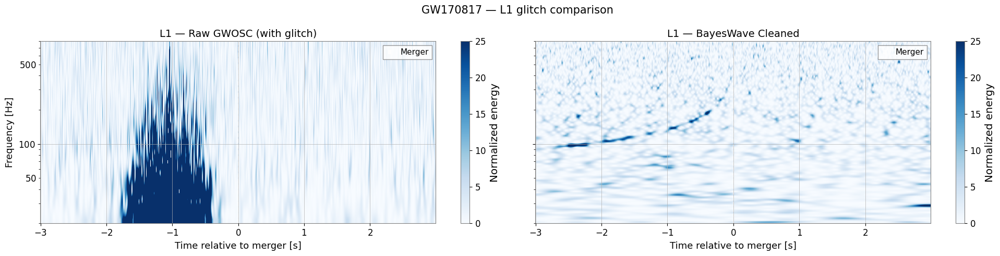

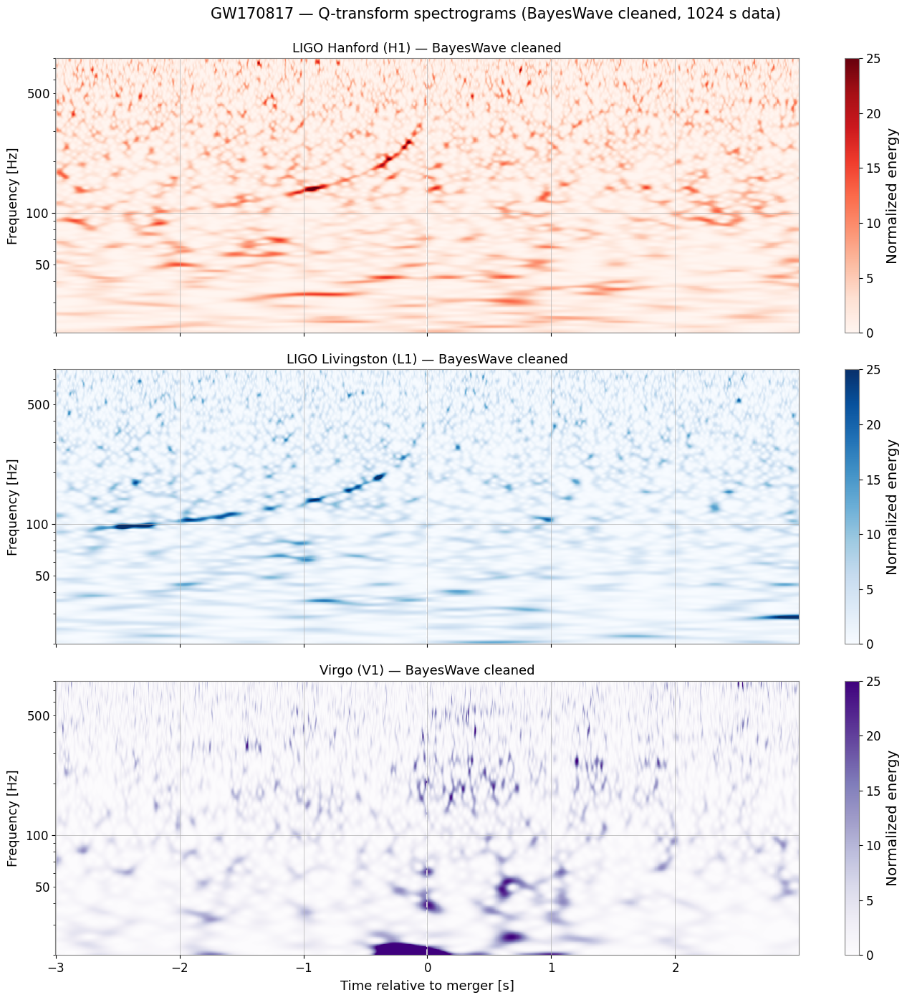

Spectrograms saved.


In [ ]:
from gwpy.timeseries import TimeSeries

MERGER_GPS   = TRIGGER_TIME
T_START_PLOT = MERGER_GPS - 3.0
T_END_PLOT   = MERGER_GPS + 3.0
F_PLOT_MIN, F_PLOT_MAX = 20.0, 800.0

DET_COLORS = {"H1": "Reds", "L1": "Blues", "V1": "Purples"}
DET_LABELS = {"H1": "LIGO Hanford (H1)", "L1": "LIGO Livingston (L1)", "V1": "Virgo (V1)"}

def _qtransform(filepath):
    strain = np.loadtxt(filepath, comments="#")
    ts = TimeSeries(strain, sample_rate=SAMPLING_RATE, t0=DATA_START_GPS)
    ts_w = ts.whiten(4, 2)
    ts_c = ts_w.crop(T_START_PLOT - 1, T_END_PLOT + 1)
    return ts_c.q_transform(frange=(F_PLOT_MIN, F_PLOT_MAX), qrange=(4, 64),
                             outseg=(T_START_PLOT, T_END_PLOT), logf=True)

# ── Raw vs BayesWave-cleaned L1 comparison ──────────────────────────────
raw_l1 = os.path.join(DATA_DIR, f"L-L1_GWOSC_4KHZ_R1-{DATA_START_GPS}-{DATA_DURATION}.txt")
if os.path.isfile(raw_l1):
    qt_raw = _qtransform(raw_l1)
    qt_cln = _qtransform(data_files["L1"])
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5), sharey=True)
    for ax, qt, title in [(ax1, qt_raw, "L1 — Raw GWOSC (with glitch)"),
                           (ax2, qt_cln, "L1 — BayesWave Cleaned")]:
        pcm = ax.pcolormesh(qt.times.value - MERGER_GPS, qt.frequencies.value,
                             qt.value.T, cmap="Blues", vmin=0, vmax=25)
        ax.set_yscale("log"); ax.set_ylim(F_PLOT_MIN, F_PLOT_MAX)
        ax.set_xlabel("Time relative to merger [s]", fontsize=13)
        ax.set_title(title, fontsize=14)
        ax.axvline(0, color="white", ls="--", lw=1.5, alpha=0.8, label="Merger")
        ax.legend(fontsize=11)
        fig.colorbar(pcm, ax=ax).set_label("Normalized energy")
    ax1.set_ylabel("Frequency [Hz]", fontsize=13)
    fig.suptitle("GW170817 — L1 glitch comparison", fontsize=15)
    fig.tight_layout()
    fig.savefig(os.path.join(OUTDIR, f"{LABEL}_L1_comparison.png"), dpi=150)
    plt.show()

# ── All three detectors ──────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(14, 14), sharex=True)
for ax, det in zip(axes, ["H1", "L1", "V1"]):
    qt = _qtransform(data_files[det])
    pcm = ax.pcolormesh(qt.times.value - MERGER_GPS, qt.frequencies.value,
                         qt.value.T, cmap=DET_COLORS[det], vmin=0, vmax=25)
    ax.set_yscale("log"); ax.set_ylim(F_PLOT_MIN, F_PLOT_MAX)
    ax.set_ylabel("Frequency [Hz]", fontsize=13)
    ax.set_title(f"{DET_LABELS[det]} — BayesWave cleaned", fontsize=13)
    ax.axvline(0, color="white", ls="--", lw=1.5, alpha=0.8)
    fig.colorbar(pcm, ax=ax).set_label("Normalized energy")
axes[-1].set_xlabel("Time relative to merger [s]", fontsize=13)
fig.suptitle("GW170817 — Q-transform spectrograms (BayesWave cleaned, 1024 s data)",
             fontsize=15, y=0.995)
fig.tight_layout()
fig.savefig(os.path.join(OUTDIR, f"{LABEL}_qtransform_bwcleaned.png"), dpi=150)
plt.show()
print("Spectrograms saved.")

## Build the time+phase-marginalized RB likelihood

We use the `build_rb_likelihood_tc_phi_marg` function which:
1. Builds the standard RB summary data (A0, B0, dd) with 400 bins
2. Pre-computes phase-stripped A0 matrices for the φc marginalization
3. Returns a function that, for each candidate (9-param) point:
   - Computes r_j⁰ at bin centres (at fiducial tc, phic=0)
   - Computes W(tc_k) = Σ_det TwoDTN · r⁰ · A0_nophase · exp(-i2πf Δtc)  via matrix multiply
   - Returns: const + logsumexp_k [log I₀(2|W(tc_k)|)] - log N_tc

In [ ]:
from relative_binning import build_rb_likelihood_tc_phi_marg

# ── Fiducial parameters (approximate MAP from arXiv:2210.15684) ──────────
# [ra, dec, logdist, incl, phic, pol, mc, q, tc, chi1, chi2, lambda1, lambda2]
FIDUCIAL_PARAMS = np.array([
    NOT_FIXED_RA,          # [0]  ra  (NGC 4993)
    NOT_FIXED_DEC,         # [1]  dec
    np.log(38.0),      # [2]  logdist — 40 Mpc
    2.545,             # [3]  theta_jn — ~146 degrees (edge-on favoured)
    0.0,               # [4]  phic (will be marginalized)
    0.0,               # [5]  pol
    1.1975,            # [6]  mc  [M_sun]
    0.78,              # [7]  q
    0.0,               # [8]  tc  (will be marginalized, relative to trigger)
    0.0,               # [9]  chi1
    0.0,               # [10] chi2
    300.0,             # [11] lambda1
    300.0,             # [12] lambda2
])

print("Building time+phase-marginalized RB likelihood...")
t0 = time.time()
log_L_tp_marg_rb, rb_network = build_rb_likelihood_tc_phi_marg(
    batched_detector, FIDUCIAL_PARAMS, _template_mlgw_bns,
    TC_GRID, n_bins=N_BINS,
)
print(f"Built in {time.time()-t0:.2f} s")

# ── JIT compile & warm up ────────────────────────────────────────────────
log_L_tp_marg_rb_jit = jax.jit(log_L_tp_marg_rb)

# 11-param array: [ra, dec, logdist, incl, pol, mc, q, chi1, chi2, lambda1, lambda2]
# (tc at index 8 removed, phic at index 4 removed → pol shifts to index 4)
_p11_fid = FIDUCIAL_PARAMS[[0,1,2,3,5,6,7,9,10,11,12]]

t_warmup = time.time()
_ = float(log_L_tp_marg_rb_jit(jnp.array(_p11_fid)))
print(f"JIT warm-up: {time.time()-t_warmup:.2f} s")
print(f"log L at fiducial (tc+φ marg, RB): {float(log_L_tp_marg_rb_jit(jnp.array(_p11_fid))):.2f}")

n_full  = len(np.array(batched_detector.Frequency[0]))
n_bins  = len(np.array(rb_network.f_bins))
print(f"\nFrequency grid: {n_full} pts → RB bins: {n_bins} pts ({n_full//n_bins}× reduction)")
print(f"tc grid: {N_TC} pts  →  total log L evaluations per call: {N_TC} × {n_bins} matrix multiply")

Building time+phase-marginalized RB likelihood...
[RB-TP] Computing reference waveform on full grid …
[RB-TP] Choosing 1200 frequency bins …
[RB-TP] Precomputing per-detector summary data …
[RB-TP] Ready.  Full grid: 189441 pts → RB bins: 2399 pts, tc grid: 700 pts
Built in 6.54 s
JIT warm-up: 4.65 s
log L at fiducial (tc+φ marg, RB): -569907.59

Frequency grid: 189441 pts → RB bins: 2399 pts (78× reduction)
tc grid: 700 pts  →  total log L evaluations per call: 700 × 2399 matrix multiply


## Configure BlackJAX nested sampler

We use the acceptance-walk nested sampler from
[blackjax_ns_gw](https://github.com/mrosep/blackjax_ns_gw).

**9 sampled parameters** (tc and φc analytically marginalized):

| Parameter | Prior | Notes |
|-----------|-------|-------|
| ln d_L    | [ln 1, ln 75] Mpc | Flat in log distance |
| θ_JN      | [0, π] | Inclination angle |
| ψ         | [0, π] | Polarization angle |
| M_c       | [1.18, 1.21] M☉ | Chirp mass |
| q         | [0.5, 1.0] | Mass ratio |
| χ₁        | [−0.5, 0.5] | Aligned spin |
| χ₂        | [−0.5, 0.5] | Aligned spin |
| Λ₁        | [5, 5000] | Tidal deformability |
| Λ₂        | [5, 5000] | Tidal deformability |

In [ ]:
import tqdm

from custom_kernels import (
    acceptance_walk_sampler,
    create_unit_cube_functions,
    init_unit_cube_particles,
    transform_to_physical,
)

# ── Parameter names (11, with tc, phic marginalized) ──────
# Note: full params order: [ra, dec, logdist, incl, pol, mc, q, chi1, chi2, ̈1, ̈2]
# We sample only the non-fixed, non-marginalized subset:
parameter_names = [
    "ra", "dec", "logdistance", "theta_jn", "pol",
    "mc", "q", "chi1", "chi2", "lambda_1", "lambda_2",
]

# ── Prior bounds ─────────────────────────────────────────────────────────────────
param_bounds = {
    "ra":          (NOT_FIXED_RA - 0.6,  NOT_FIXED_RA + 0.6),
    "dec":         (NOT_FIXED_DEC - 0.6, NOT_FIXED_DEC + 0.6),
    "logdistance": (jnp.log(1.0),   jnp.log(55.0)),
    "theta_jn":    (0.0,             jnp.pi),
    "pol":         (0.0,             jnp.pi),
    "mc":          (1.19,            1.20),
    "q":           (0.6,             1.0),
    "chi1":        (-0.2,            0.2),
    "chi2":        (-0.2,            0.2),
    "lambda_1":    (5.0,             1200.0),
    "lambda_2":    (5.0,             1200.0),
}

# ── Build 11-param array for the likelihood from the sampled params ────
def loglikelihood_from_dict(params_dict):
    """Map 11-param BlackJAX-NS dict → 11-param array → tc+φ-marg RB log L."""
    # Full 11-param array: [ra, dec, logdist, incl, pol, mc, q, chi1, chi2, ̈1, ̈2]
    params_11 = jnp.array([
        params_dict["ra"],               # [0]
        params_dict["dec"],              # [1]
        params_dict["logdistance"],      # [2]
        params_dict["theta_jn"],         # [3]
        params_dict["pol"],              # [4]
        params_dict["mc"],               # [5]
        params_dict["q"],                # [6]
        params_dict["chi1"],             # [7]
        params_dict["chi2"],             # [8]
        params_dict["lambda_1"],         # [9]
        params_dict["lambda_2"],         # [10]
    ])
    return log_L_tp_marg_rb_jit(params_11)

# Determine JAX's ravel order for the parameter dict
_example = {key: float(i) for i, key in enumerate(parameter_names)}
_flat, _ = jax.flatten_util.ravel_pytree(_example)
_ravel_order = []
for val in _flat:
    for key, test_val in _example.items():
        if abs(val - test_val) < 1e-10:
            _ravel_order.append(key)
            break
print(f"JAX ravel order: {_ravel_order}")

n_dims = len(parameter_names)

# ── Unit-cube prior transform ─────────────────────────────────────────────────
@jax.jit
def prior_transform_fn(u_params):
    x_params = {}
    for k in parameter_names:
        u_val = u_params[k]
        if k == "logdistance":
            # Volumetric prior: p(d) ~ d^2
            d_min = jnp.exp(param_bounds[k][0])
            d_max = jnp.exp(param_bounds[k][1])
            d_val = (d_min**3 + u_val * (d_max**3 - d_min**3))**(1/3)
            x_params[k] = jnp.log(d_val)
        elif k == "theta_jn":
            # Uniform prior in cos(theta)
            cos_min = jnp.cos(param_bounds[k][0])
            cos_max = jnp.cos(param_bounds[k][1])
            cos_val = cos_min + u_val * (cos_max - cos_min)
            x_params[k] = jnp.arccos(cos_val)
        elif k == "dec":
            # Isotropic prior: p(dec) ~ cos(dec), which means uniform in sin(dec)
            sin_min = jnp.sin(param_bounds[k][0])
            sin_max = jnp.sin(param_bounds[k][1])
            sin_val = sin_min + u_val * (sin_max - sin_min)
            x_params[k] = jnp.arcsin(sin_val)
        else:
            # Uniform prior for other parameters
            x_params[k] = param_bounds[k][0] + u_val * (param_bounds[k][1] - param_bounds[k][0])
    return x_params

print(f"Sampling {n_dims} parameters: {parameter_names}")
print(f"Analytically marginalized: tc (over {N_TC}-pt grid), φc (Bessel function)")


JAX ravel order: ['chi1', 'chi2', 'dec', 'lambda_1', 'lambda_2', 'logdistance', 'mc', 'pol', 'q', 'ra', 'theta_jn']
Sampling 11 parameters: ['ra', 'dec', 'logdistance', 'theta_jn', 'pol', 'mc', 'q', 'chi1', 'chi2', 'lambda_1', 'lambda_2']
Analytically marginalized: tc (over 700-pt grid), φc (Bessel function)


In [ ]:
@jax.jit
def one_step(carry, xs):
    state, k = carry
    k, subk = jax.random.split(k)
    state, dead_point = nested_sampler.step(subk, state)
    return (state, k), dead_point


def terminate(state):
    dlogz = jnp.logaddexp(0, state.logZ_live - state.logZ)
    return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)


print(f"Starting BlackJAX-NS with {N_LIVE} live points (tc+φ-marg, 9-D space)...")
t_start = time.time()
dead    = []
n_iter  = 0

CHECKPOINT_EVERY = 400  # save state every N iterations

Starting BlackJAX-NS with 20000 live points (tc+φ-marg, 9-D space)...


In [ ]:
rng_key = jax.random.PRNGKey(SEED)
rng_key, init_key = jax.random.split(rng_key)

example_params = {key: 0.0 for key in parameter_names}

# ── Initialize live points ───────────────────────────────────────────────
unit_cube_particles = init_unit_cube_particles(init_key, example_params, N_LIVE)

# ── Periodic parameter mask (pol is periodic in [0, π]) ─────────────────
periodic_mask = jax.tree_util.tree_map(lambda _: False, example_params)
periodic_mask["pol"] = True

# ── Create unit-cube wrappers ────────────────────────────────────────────
unit_cube_fns = create_unit_cube_functions(
    physical_loglikelihood_fn=loglikelihood_from_dict,
    prior_transform_fn=prior_transform_fn,
    mask_tree=periodic_mask,
)

# ── Build nested sampler ─────────────────────────────────────────────────
nested_sampler = acceptance_walk_sampler(
    logprior_fn=unit_cube_fns["logprior_fn"],
    loglikelihood_fn=unit_cube_fns["loglikelihood_fn"],
    nlive=N_LIVE,
    n_target=N_TARGET,
    max_mcmc=MAX_MCMC,
    num_delete=N_DELETE,
    stepper_fn=unit_cube_fns["stepper_fn"],
)

state = nested_sampler.init(unit_cube_particles)

print(f"BlackJAX-NS configured:")
print(f"  Live points:     {N_LIVE}")
print(f"  Batch delete:    {N_DELETE}")
print(f"  Target walks:    {N_TARGET}")
print(f"  Max MCMC:        {MAX_MCMC}")
print(f"  Stop at ΔlnZ <   {DLOGZ_STOP}")
print(f"  Seed:            {SEED}")

BlackJAX-NS configured:
  Live points:     20000
  Batch delete:    18000
  Target walks:    20
  Max MCMC:        500
  Stop at ΔlnZ <   0.1
  Seed:            42


In [ ]:
@jax.jit
def one_step(carry, xs):
    state, k = carry
    k, subk = jax.random.split(k)
    state, dead_point = nested_sampler.step(subk, state)
    return (state, k), dead_point


def terminate(state):
    dlogz = jnp.logaddexp(0, state.logZ_live - state.logZ)
    return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)


print(f"Starting BlackJAX-NS with {N_LIVE} live points (tc+φ-marg, 9-D space)...")
t_start = time.time()
dead    = []
n_iter  = 0

CHECKPOINT_EVERY = 1000  # save state every N iterations

with tqdm.tqdm(desc="Dead pts", unit=" pts") as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint
        if n_iter % CHECKPOINT_EVERY == 0:
            ckpt = {"state": state, "dead": dead, "n_iter": n_iter}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s — {n_dead_total} dead points")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")

Starting BlackJAX-NS with 20000 live points (tc+φ-marg, 9-D space)...


Dead pts: 180000 pts [20:57, 143.18 pts/s]


Done in 1257.1 s — 180000 dead points
log Z (running):  -569884.585
log Z (live):     -569887.909
Δlog Z:           0.0354


Final state saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_final_state.pkl
Posterior samples saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_posterior.csv
Corner plot saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_corner_final.png


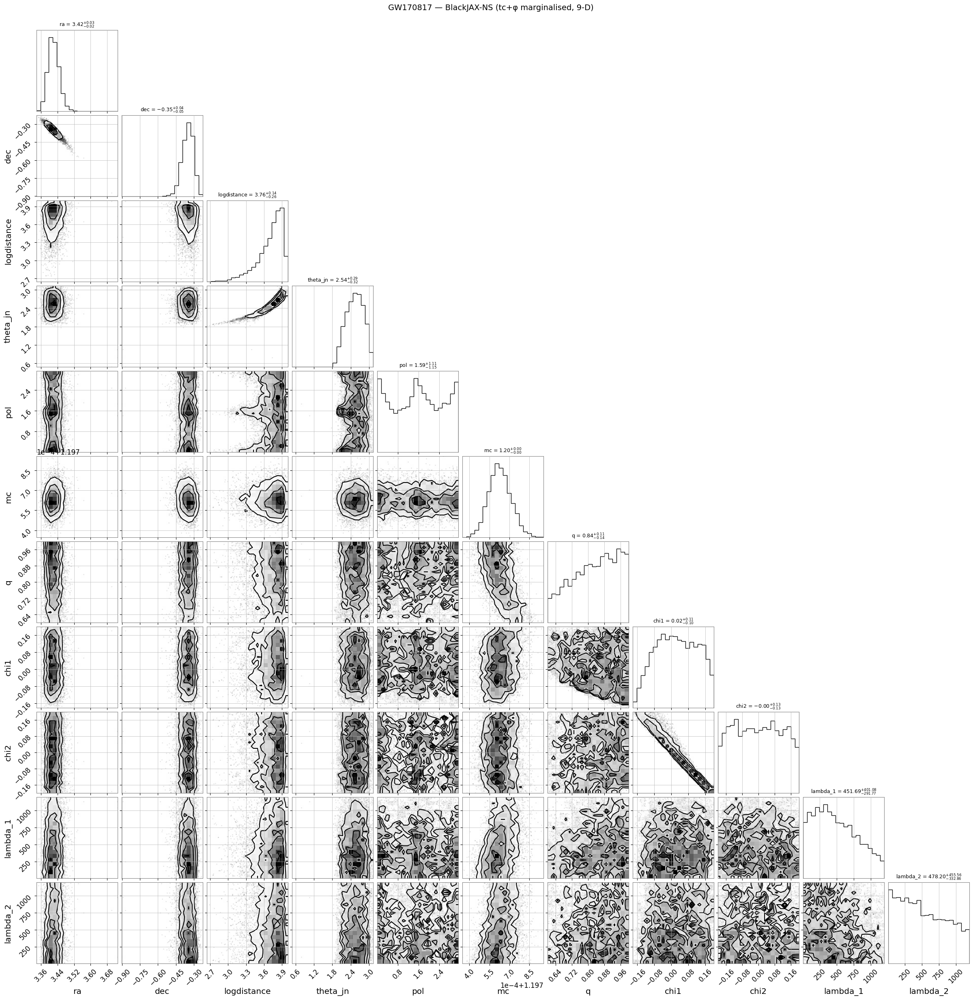

In [ ]:
import os
import pickle
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
from corner import corner as corner_plot
from blackjax.ns.utils import finalise
from anesthetic import NestedSamples

# ── Finalise: merge dead + live ──────────────────────────────────────────
final_state = finalise(state, dead)

# ── Save final state ─────────────────────────────────────────────────────
state_path = os.path.join(OUTDIR, f"{LABEL}_final_state.pkl")
with open(state_path, "wb") as f:
    pickle.dump(final_state, f)
print(f"Final state saved: {state_path}")

# ── Transform unit-cube → physical space ─────────────────────────────────
physical_particles = transform_to_physical(final_state.particles, prior_transform_fn)

column_to_label = {
    "logdistance": r"$\ln d_L$", "theta_jn": r"$\theta_{JN}$", "pol": r"$\psi$",
    "mc": r"$\mathcal{M}_c$", "q": r"$q$", "chi1": r"$\chi_1$", "chi2": r"$\chi_2$",
    "lambda_1": r"$\Lambda_1$", "lambda_2": r"$\Lambda_2$",
}

logL_birth = jnp.where(jnp.isnan(final_state.loglikelihood_birth), -jnp.inf, final_state.loglikelihood_birth)

# ── Create and save NestedSamples ────────────────────────────────────────
samples_anesthetic = NestedSamples(
    physical_particles,
    logL=final_state.loglikelihood,
    logL_birth=logL_birth,
    labels=column_to_label,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

csv_path = os.path.join(OUTDIR, f"{LABEL}_posterior.csv")
samples_anesthetic.to_csv(csv_path)
print(f"Posterior samples saved: {csv_path}")

# ── Plot Corner ──────────────────────────────────────────────────────────
# Generate equally-weighted samples
eq_samples = samples_anesthetic.sample(n=5000, replace=True)
eq_array = np.column_stack([np.array(eq_samples[k]) for k in _ravel_order])
ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
samples_plot = eq_array[:, ravel_to_param_idx]

fig = corner_plot(samples_plot, show_titles=True, labels=parameter_names, title_kwargs={"fontsize": 9})
fig.suptitle(f"GW170817 — BlackJAX-NS (tc+φ marginalised, 9-D)", fontsize=14, y=1.01)
corner_path = os.path.join(OUTDIR, f"{LABEL}_corner_final.png")
fig.savefig(corner_path, dpi=150, bbox_inches="tight")
print(f"Corner plot saved: {corner_path}")
plt.show()

Final state saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_final_state.pkl
Posterior samples saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_posterior.csv
Corner plot saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_corner_final.png


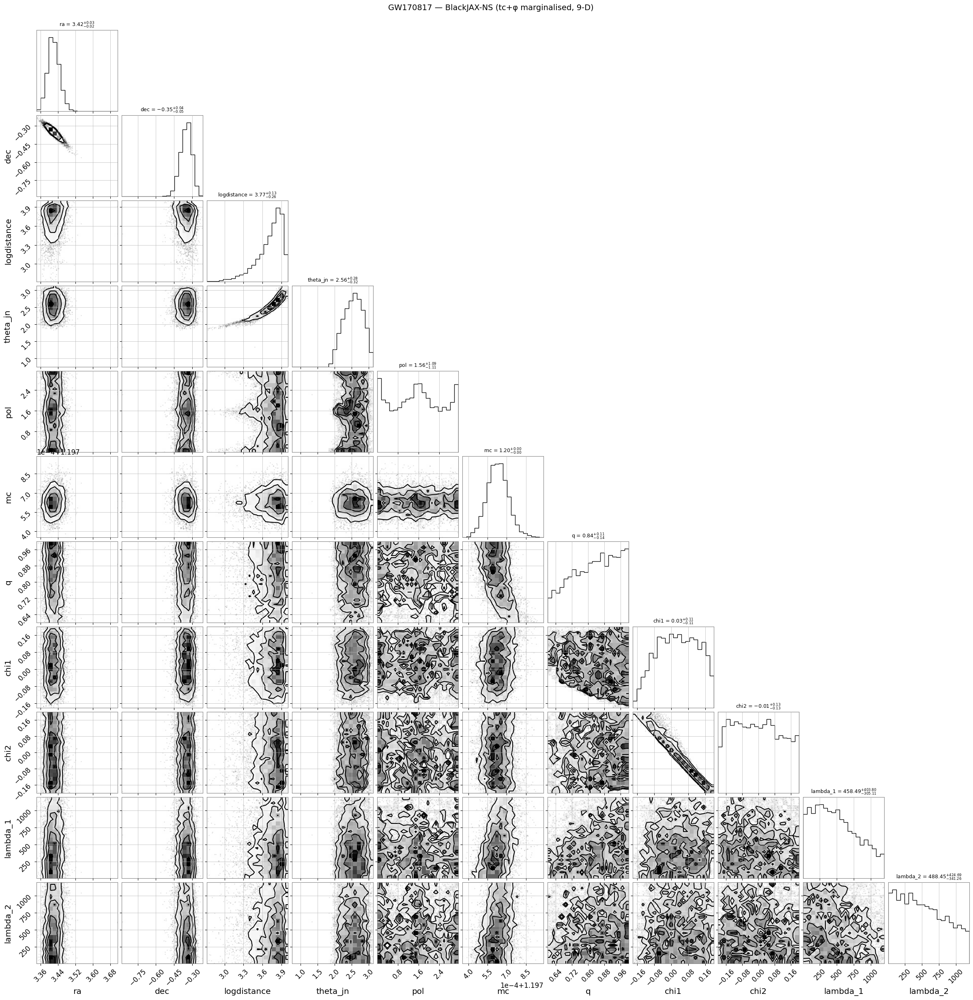

In [ ]:
import os
import pickle
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
from corner import corner as corner_plot
from blackjax.ns.utils import finalise
from anesthetic import NestedSamples

# ── Finalise: merge dead + live ──────────────────────────────────────────
final_state = finalise(state, dead)

# ── Save final state ─────────────────────────────────────────────────────
state_path = os.path.join(OUTDIR, f"{LABEL}_final_state.pkl")
with open(state_path, "wb") as f:
    pickle.dump(final_state, f)
print(f"Final state saved: {state_path}")

# ── Transform unit-cube → physical space ─────────────────────────────────
physical_particles = transform_to_physical(final_state.particles, prior_transform_fn)

column_to_label = {
    "logdistance": r"$\ln d_L$", "theta_jn": r"$\theta_{JN}$", "pol": r"$\psi$",
    "mc": r"$\mathcal{M}_c$", "q": r"$q$", "chi1": r"$\chi_1$", "chi2": r"$\chi_2$",
    "lambda_1": r"$\Lambda_1$", "lambda_2": r"$\Lambda_2$",
}

logL_birth = jnp.where(jnp.isnan(final_state.loglikelihood_birth), -jnp.inf, final_state.loglikelihood_birth)

# ── Create and save NestedSamples ────────────────────────────────────────
samples_anesthetic = NestedSamples(
    physical_particles,
    logL=final_state.loglikelihood,
    logL_birth=logL_birth,
    labels=column_to_label,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

csv_path = os.path.join(OUTDIR, f"{LABEL}_posterior.csv")
samples_anesthetic.to_csv(csv_path)
print(f"Posterior samples saved: {csv_path}")

# ── Plot Corner ──────────────────────────────────────────────────────────
# Generate equally-weighted samples
eq_samples = samples_anesthetic.sample(n=5000, replace=True)
eq_array = np.column_stack([np.array(eq_samples[k]) for k in _ravel_order])
ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
samples_plot = eq_array[:, ravel_to_param_idx]

fig = corner_plot(samples_plot, show_titles=True, labels=parameter_names, title_kwargs={"fontsize": 9})
fig.suptitle(f"GW170817 — BlackJAX-NS (tc+φ marginalised, 9-D)", fontsize=14, y=1.01)
corner_path = os.path.join(OUTDIR, f"{LABEL}_corner_final.png")
fig.savefig(corner_path, dpi=150, bbox_inches="tight")
print(f"Corner plot saved: {corner_path}")
plt.show()

# ANALYSIS

In [ ]:
import h5py
import corner
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
file_path = '/content/GW170817_GWTC-1 (1).hdf5'

Available keys in the HDF5 file: ['IMRPhenomPv2NRT_highSpin_posterior', 'IMRPhenomPv2NRT_highSpin_prior', 'IMRPhenomPv2NRT_lowSpin_posterior', 'IMRPhenomPv2NRT_lowSpin_prior']
Extracting data from: IMRPhenomPv2NRT_lowSpin_posterior
Plotting parameters: ['m1_detector_frame_Msun', 'm2_detector_frame_Msun', 'luminosity_distance_Mpc', 'costheta_jn']


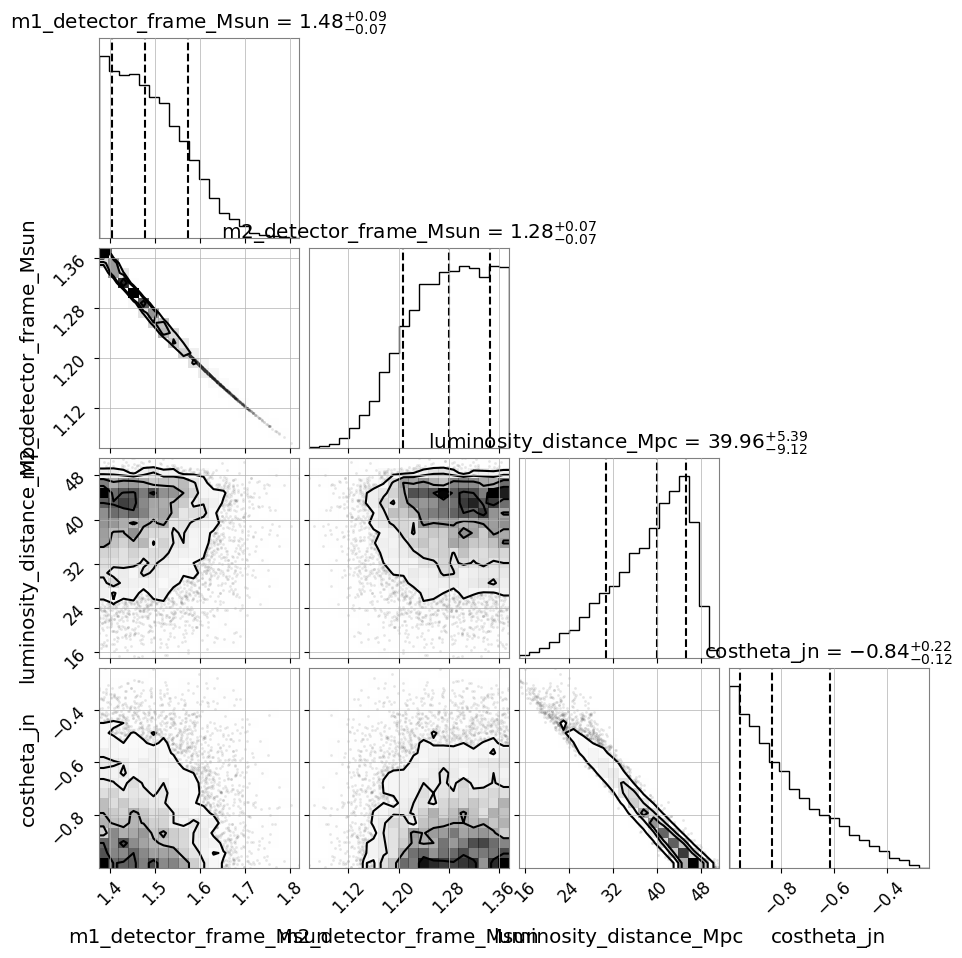

In [ ]:


with h5py.File(file_path, 'r') as f:
    keys = list(f.keys())
    print("Available keys in the HDF5 file:", keys)

    # Pick the first key (usually the primary waveform model/approximant)
    target_key = keys[2]
    print(f"Extracting data from: {target_key}")

    data = f[target_key]
    # Handle standard GWOSC HDF5 structures
    if isinstance(data, h5py.Group) and 'posterior_samples' in data.keys():
        data = data['posterior_samples']

    data_arr = data[:]

    # Extract a few parameters for the corner plot
    if data_arr.dtype.names:
        # Look for standard parameter names, or just use the first three if not found
        target_params = ['m1_detector_frame_Msun', 'm2_detector_frame_Msun', 'luminosity_distance_Mpc', 'costheta_jn']
        plot_params = [p for p in target_params if p in data_arr.dtype.names]

        if not plot_params:
            plot_params = list(data_arr.dtype.names)[:3]

        print(f"Plotting parameters: {plot_params}")
        samples = np.vstack([data_arr[p] for p in plot_params]).T
        labels = plot_params
    else:
        samples = data_arr[:, :3]
        labels = [f"Param {i}" for i in range(samples.shape[1])]

# Generate the corner plot with normalized 1D histograms
fig = corner.corner(samples, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True, hist_kwargs={'density': True})
plt.show()

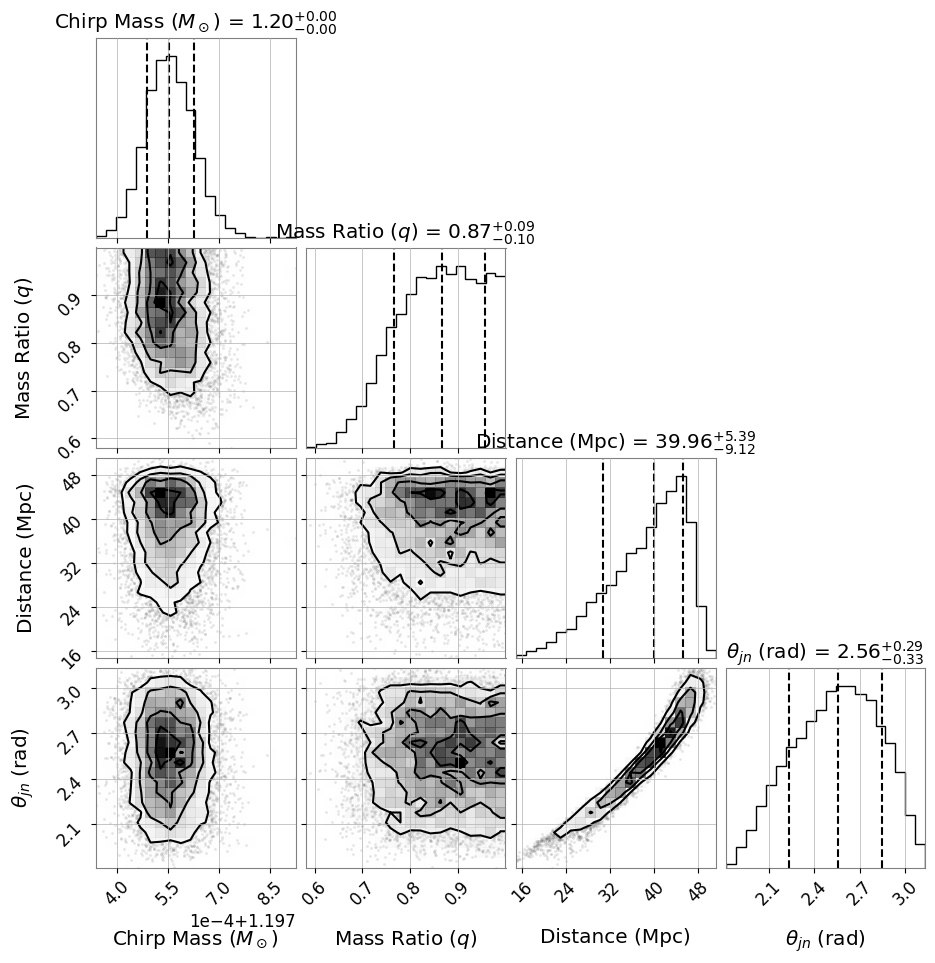

In [ ]:
m1 = data_arr['m1_detector_frame_Msun']
m2 = data_arr['m2_detector_frame_Msun']
dist = data_arr['luminosity_distance_Mpc']
costheta = data_arr['costheta_jn']

# Calculate derived parameters
# Chirp mass: (m1 * m2)^(3/5) / (m1 + m2)^(1/5)
mchirp = (m1 * m2)**(3/5) / (m1 + m2)**(1/5)

# Mass ratio (assuming m2 <= m1, so q <= 1)
q = m2 / m1

# theta_jn
theta_jn = np.arccos(costheta)

# Prepare samples and labels for the new corner plot
samples_converted = np.vstack([mchirp, q, dist, theta_jn]).T
labels_converted = [
    r'Chirp Mass ($M_\odot$)',
    r'Mass Ratio ($q$)',
    r'Distance (Mpc)',
    r'$\theta_{jn}$ (rad)'
]

# Generate the new corner plot with normalized 1D histograms
fig_converted = corner.corner(
    samples_converted,
    labels=labels_converted,
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    hist_kwargs={'density': True}
)
plt.show()

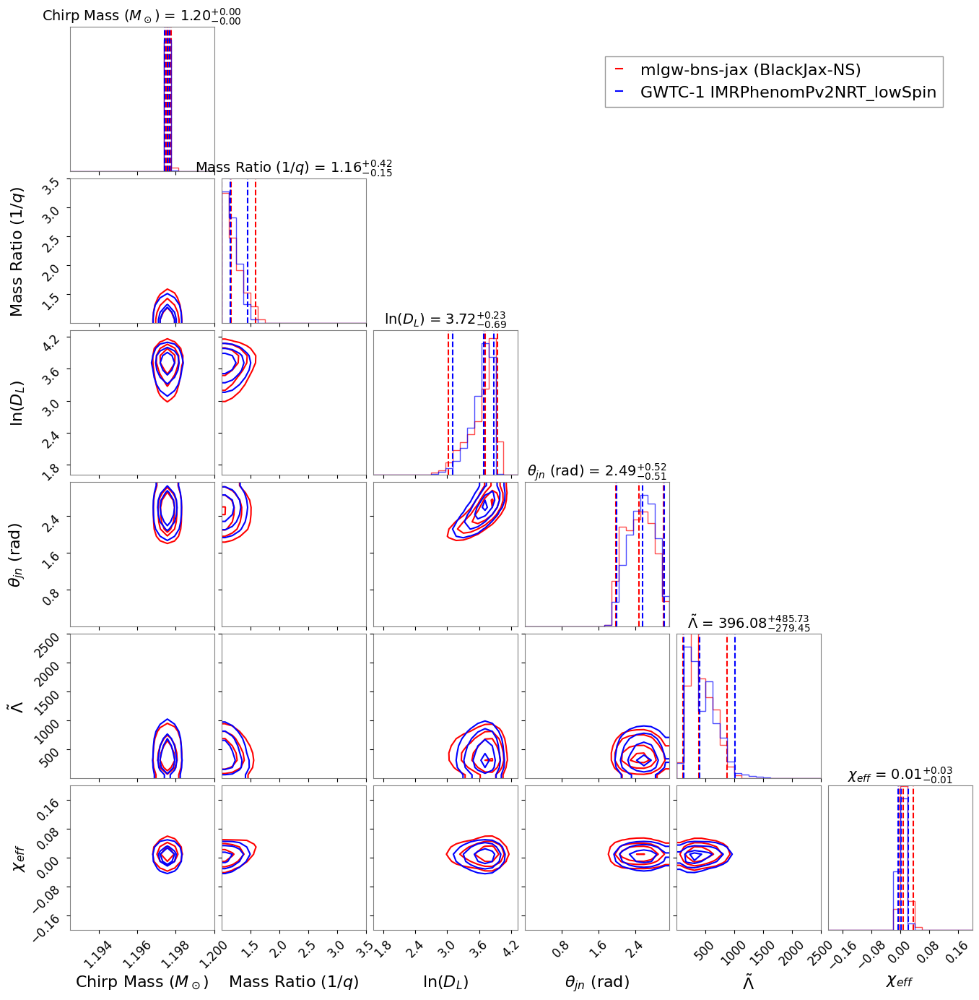

In [ ]:
import corner
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
import logging
import pandas as pd

# Suppress the specific contour warning from corner
logging.getLogger('root').setLevel(logging.ERROR)

# 1. HDF5 Samples (Already computed in previous cells as `samples_converted`)
# Order: mchirp, q, dist, theta_jn

# 2. CSV Samples
# Carregar as amostras geradas do arquivo CSV correspondente
# Pula as duas primeiras linhas de metadados do anesthetic (labels e weights)
df_csv = pd.read_csv(csv_path, skiprows=[1, 2])

# We extract them from `df_csv` and use `logdistance` directly
# Taking only the final 50000 samples to discard burn-in
n_samples = 60000
mc_csv = df_csv['mc'].values[-n_samples:].astype(float)
q_csv = df_csv['q'].values[-n_samples:].astype(float)
logdist_csv = df_csv['logdistance'].values[-n_samples:].astype(float)
theta_jn_csv = df_csv['theta_jn'].values[-n_samples:].astype(float)

# Calculate Lambda_tilde and chi_eff for CSV
m1_csv = mc_csv * (1 + q_csv)**0.2 / q_csv**0.6
m2_csv = m1_csv * q_csv
lambda1_csv_vals = df_csv['lambda_1'].values[-n_samples:].astype(float)
lambda2_csv_vals = df_csv['lambda_2'].values[-n_samples:].astype(float)
chi1_csv = df_csv['chi1'].values[-n_samples:].astype(float)
chi2_csv = df_csv['chi2'].values[-n_samples:].astype(float)

mtot_csv = m1_csv + m2_csv
lam_tilde_csv = (16./13.) * ((m1_csv + 12.*m2_csv)*m1_csv**4 * lambda1_csv_vals + (m2_csv + 12.*m1_csv)*m2_csv**4 * lambda2_csv_vals) / (mtot_csv**5)
chi_eff_csv = (m1_csv * chi1_csv + m2_csv * chi2_csv) / mtot_csv

# Invert q for plotting
inv_q_csv = 1.0 / q_csv

samples_csv_converted = np.vstack([mc_csv, inv_q_csv, logdist_csv, theta_jn_csv, lam_tilde_csv, chi_eff_csv]).T

# Calculate Lambda_tilde and chi_eff for HDF5 (using data_arr from kernel)
try:
    m1_hdf5 = data_arr['m1_detector_frame_Msun']
    m2_hdf5 = data_arr['m2_detector_frame_Msun']
    mtot_hdf5 = m1_hdf5 + m2_hdf5

    # Lambda_tilde
    lam1_key_hdf5 = next((k for k in ['lambda_1', 'lambda1'] if k in data_arr.dtype.names), None)
    lam2_key_hdf5 = next((k for k in ['lambda_2', 'lambda2'] if k in data_arr.dtype.names), None)
    if lam1_key_hdf5 and lam2_key_hdf5:
        lam1_hdf5 = data_arr[lam1_key_hdf5]
        lam2_hdf5 = data_arr[lam2_key_hdf5]
        lam_tilde_hdf5 = (16./13.) * ((m1_hdf5 + 12.*m2_hdf5)*m1_hdf5**4 * lam1_hdf5 + (m2_hdf5 + 12.*m1_hdf5)*m2_hdf5**4 * lam2_hdf5) / (mtot_hdf5**5)
    else:
        lam_tilde_hdf5 = np.zeros(len(samples_converted))

    # Chi_eff - Corrected using spin magnitudes and tilt angles
    if 'spin1' in data_arr.dtype.names and 'costilt1' in data_arr.dtype.names:
        spin1z_hdf5 = data_arr['spin1'] * data_arr['costilt1']
        spin2z_hdf5 = data_arr['spin2'] * data_arr['costilt2']
        chi_eff_hdf5 = (m1_hdf5 * spin1z_hdf5 + m2_hdf5 * spin2z_hdf5) / mtot_hdf5
    else:
        chieff_key = next((k for k in ['chi_eff', 'chieff'] if k in data_arr.dtype.names), None)
        chi1_key = next((k for k in ['spin_1z', 'a_1z', 'chi1', 'spin1z', 'a1z', 'spin1', 'a1'] if k in data_arr.dtype.names), None)
        chi2_key = next((k for k in ['spin_2z', 'a_2z', 'chi2', 'spin2z', 'a2z', 'spin2', 'a2'] if k in data_arr.dtype.names), None)

        if chieff_key:
            chi_eff_hdf5 = data_arr[chieff_key]
        elif chi1_key and chi2_key:
            chi1_hdf5 = data_arr[chi1_key]
            chi2_hdf5 = data_arr[chi2_key]
            chi_eff_hdf5 = (m1_hdf5 * chi1_hdf5 + m2_hdf5 * chi2_hdf5) / mtot_hdf5
        else:
            print("Warning: Spin keys not found in HDF5. Defaulting chi_eff to 0 for plotting compatibility.")
            chi_eff_hdf5 = np.zeros(len(samples_converted))

except Exception as e:
    print(f"Warning: Error parsing HDF5 parameters ({e}). Using zeros as fallback.")
    lam_tilde_hdf5 = np.zeros(len(samples_converted))
    chi_eff_hdf5 = np.zeros(len(samples_converted))

# Extract and invert q for HDF5
mchirp_hdf5 = samples_converted[:, 0]
inv_q_hdf5 = 1.0 / samples_converted[:, 1]
logdist_hdf5 = np.log(samples_converted[:, 2])
theta_jn_hdf5 = samples_converted[:, 3]

samples_converted_6d = np.column_stack([mchirp_hdf5, inv_q_hdf5, logdist_hdf5, theta_jn_hdf5, lam_tilde_hdf5, chi_eff_hdf5])

labels = [
    r'Chirp Mass ($M_\odot$)',
    r'Mass Ratio ($1/q$)',
    r'$\ln(D_L)$',
    r'$\theta_{jn}$ (rad)',
    r'$\tilde{\Lambda}$',
    r'$\chi_{eff}$'
]

# Define the range for each parameter. The prior for theta_jn is [0, pi]
# Spin effective is typically narrow for low-spin BNS priors, setting it to [-0.1, 0.1]
plot_ranges = [(1.1925, 1.200), (1.0, 3.5), (np.log(5), np.log(75)), (0.0, np.pi), (0, 2500), (-0.2, 0.2)]

# Generate the base plot using the CSV samples (Red)
fig = corner.corner(
    samples_csv_converted,
    labels=labels,
    label_kwargs={'fontsize': 16},
    smooth=1,
    color='red',
    hist_kwargs={'density': True, 'alpha': 0.7},
    show_titles=True,
    title_kwargs={"fontsize": 14},
    range=plot_ranges,
    plot_datapoints=False,
    plot_density=False,
    fill_contours=False,
    quantiles=[0.025, 0.5, 0.975]  # 95% interval lines + median
)

# Overlay the HDF5 samples on the same figure (Blue)
# Making the 1D histograms visible with some transparency
corner.corner(
    samples_converted_6d,
    smooth=1,
    fig=fig,
    color='blue',
    hist_kwargs={'density': True, 'alpha': 0.7},
    range=plot_ranges,
    plot_datapoints=False,
    plot_density=False,
    fill_contours=False,
    quantiles=[0.025, 0.5, 0.975]  # 95% interval lines + median
)

# Remove background grid lines
for ax in fig.axes:
    ax.grid(False)

red_line = mlines.Line2D([], [], color='red', label='mlgw-bns-jax (BlackJax-NS)')

# Add a custom legend to distinguish the two datasets
blue_line = mlines.Line2D([], [], color='blue', label='GWTC-1 IMRPhenomPv2NRT_lowSpin')

fig.legend(handles=[red_line,blue_line], loc='upper right', bbox_to_anchor=(0.95, 0.95), fontsize=16)

#plt.suptitle("Posterior Comparison: GWTC-1 HDF5 vs Time Marg PE CSV", fontsize=16)
plt.savefig('corner_plot_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

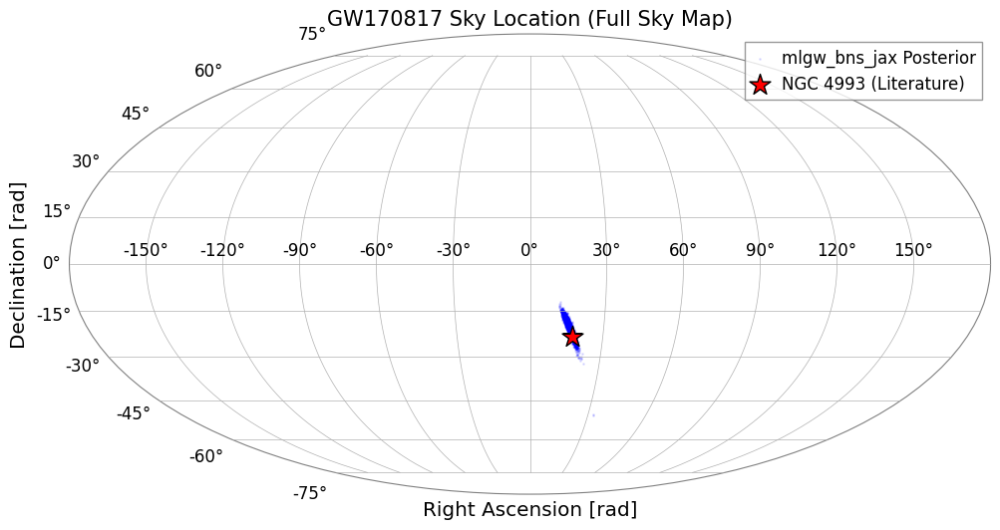

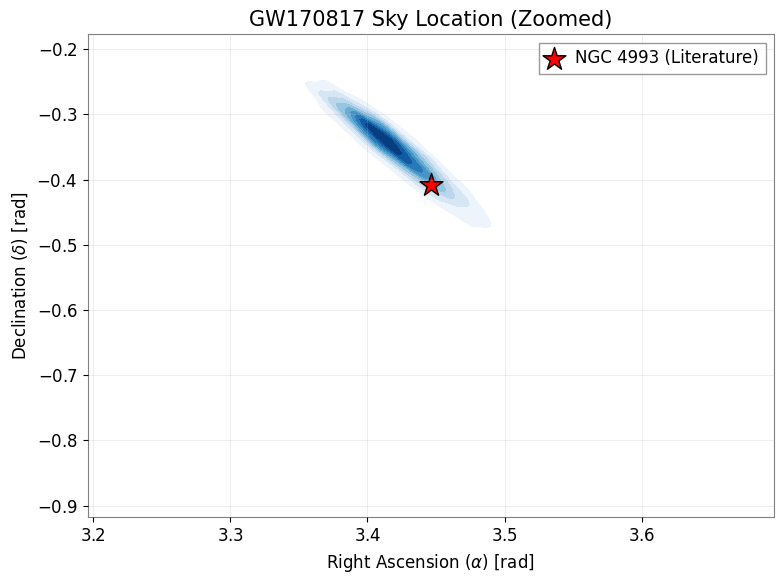

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

if 'ra_samples' in locals() and 'dec_samples' in locals():
    ra_true = 3.44616
    dec_true = -0.408084

    # ── 1. Full Sky Map (Mollweide Projection) ─────────────────────────
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(111, projection='mollweide')
    ax.grid(True)

    # Matplotlib's mollweide projection expects RA in [-pi, pi]
    ra_samples_shifted = ra_samples - np.pi
    ra_true_shifted = ra_true - np.pi

    # Plot posterior samples
    ax.scatter(ra_samples_shifted, dec_samples, s=1, alpha=0.1, color='blue', label='mlgw_bns_jax Posterior')

    # Plot true literature location
    ax.scatter(ra_true_shifted, dec_true, marker='*', color='red', edgecolor='black', s=250, label='NGC 4993 (Literature)')

    ax.set_title("GW170817 Sky Location (Full Sky Map)", fontsize=15)
    ax.set_xlabel("Right Ascension [rad]")
    ax.set_ylabel("Declination [rad]")
    ax.legend(loc='upper right')
    plt.savefig("sky_location_full.png", dpi=300, bbox_inches="tight")
    plt.show()

    # ── 2. Zoomed-in Sky Map (Contours) ──────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))

    # Smooth posterior contours using KDE
    sns.kdeplot(x=ra_samples, y=dec_samples, fill=True, cmap='Blues', levels=10, ax=ax, thresh=0.05)

    # True literature location
    ax.scatter(ra_true, dec_true, marker='*', color='red', edgecolor='black', s=300, label='NGC 4993 (Literature)')

    # Increase Right Ascension range
    ax.set_xlim(ra_true - 0.25, ra_true + 0.25)

    ax.set_xlabel(r"Right Ascension ($\alpha$) [rad]", fontsize=12)
    ax.set_ylabel(r"Declination ($\delta$) [rad]", fontsize=12)
    ax.set_title("GW170817 Sky Location (Zoomed)", fontsize=15)
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig("sky_location_zoomed.png", dpi=300, bbox_inches="tight")
    plt.show()
else:
    print("RA and Dec samples not found in memory. Ensure the 11-D sky inference section is run.")

In [ ]:
print(f"Minimum chi_eff calculated from HDF5 previously: {chi_eff_hdf5.min():.4f}")

# Let's see what spin-related keys we have in the HDF5 data
spin_keys = [k for k in data_arr.dtype.names if 'spin' in k or 'tilt' in k or 'a_1' in k or 'a_2' in k or 'chi' in k]
print("\nSpin-related keys available in HDF5:", spin_keys)

# Properly calculate chi_eff taking tilts into account
if 'spin1' in data_arr.dtype.names and 'costilt1' in data_arr.dtype.names:
    print("\nCalculating chi_eff using spin magnitudes and costilts...")
    a1 = data_arr['spin1']
    costilt1 = data_arr['costilt1']
    a2 = data_arr['spin2']
    costilt2 = data_arr['costilt2']

    spin1z = a1 * costilt1
    spin2z = a2 * costilt2

    chi_eff_hdf5_corrected = (m1_hdf5 * spin1z + m2_hdf5 * spin2z) / mtot_hdf5

    print(f"Minimum chi_eff (corrected): {chi_eff_hdf5_corrected.min():.4f}")
    print(f"Maximum chi_eff (corrected): {chi_eff_hdf5_corrected.max():.4f}")

    # Update the array for plotting if you want to rerun the corner plot cell
    chi_eff_hdf5 = chi_eff_hdf5_corrected
else:
    print("\nCould not find spin and tilt keys to correct the calculation.")

Minimum chi_eff calculated from HDF5 previously: -0.0136

Spin-related keys available in HDF5: ['spin1', 'spin2', 'costilt1', 'costilt2']

Calculating chi_eff using spin magnitudes and costilts...
Minimum chi_eff (corrected): -0.0136
Maximum chi_eff (corrected): 0.0461


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

if 'samples_plot_sky' not in locals():
    print("Error: `samples_plot_sky` not found.")
    print("Please run the 'Parameter Estimation including Sky Position' (11-D) section first.")
else:
    ra_samples = samples_plot_sky[:, 0]
    dec_samples = samples_plot_sky[:, 1]

    ra_true = 3.44616
    dec_true = -0.408084

    # ── 1. Full Sky Map (Mollweide Projection) ───────────────────────────────
    fig = plt.figure(figsize=(12, 6))
    ax = fig.add_subplot(111, projection='mollweide')
    ax.grid(True)

    # Matplotlib's mollweide projection expects RA in [-pi, pi]
    ra_samples_shifted = ra_samples - np.pi
    ra_true_shifted = ra_true - np.pi

    # Plot posterior samples
    ax.scatter(ra_samples_shifted, dec_samples, s=1, alpha=0.1, color='blue', label='BlackJAX-NS Posterior')

    # Plot true literature location
    ax.scatter(ra_true_shifted, dec_true, marker='*', color='red', edgecolor='black', s=250, label='NGC 4993 (Literature)')

    ax.set_title("GW170817 Sky Location (Full Sky Map)", fontsize=15)
    ax.set_xlabel("Right Ascension [rad]")
    ax.set_ylabel("Declination [rad]")
    ax.legend(loc='upper right')
    plt.show()

    # ── 2. Zoomed-in Sky Map (2D Histogram) ──────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))

    # 2D density histogram of the posteriors
    h = ax.hist2d(ra_samples, dec_samples, bins=50, cmap='Blues', density=True)
    fig.colorbar(h[3], ax=ax, label='Probability Density')

    # True literature location
    ax.scatter(ra_true, dec_true, marker='*', color='red', edgecolor='black', s=300, label='NGC 4993 (Literature)')

    ax.set_xlabel(r"Right Ascension ($\alpha$) [rad]", fontsize=12)
    ax.set_ylabel(r"Declination ($\delta$) [rad]", fontsize=12)
    ax.set_title("GW170817 Sky Location (Zoomed)", fontsize=15)
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('sky_location_map_zoomed.png', dpi=300)
    plt.show()


Error: `samples_plot_sky` not found.
Please run the 'Parameter Estimation including Sky Position' (11-D) section first.


In [ ]:
import corner
import matplotlib.pyplot as plt
import numpy as np

print("Note: The dataframe `df_csv` is from the 9-dimensional parameter estimation.")
print("In that run, Right Ascension (`ra`) and Declination (`dec`) were fixed to literature values and are not present as sampled parameters.")
print("To plot the sky location posteriors, please run the 11-dimensional sky inference section below.")

# The 11-D sky inference creates its own posterior samples which include 'ra' and 'dec'.
# Once that run is complete, you can use `df_sky` to plot the sky location comparison.

Note: The dataframe `df_csv` is from the 9-dimensional parameter estimation.
In that run, Right Ascension (`ra`) and Declination (`dec`) were fixed to literature values and are not present as sampled parameters.
To plot the sky location posteriors, please run the 11-dimensional sky inference section below.


In [ ]:
samples_plot.shape

(5000, 11)

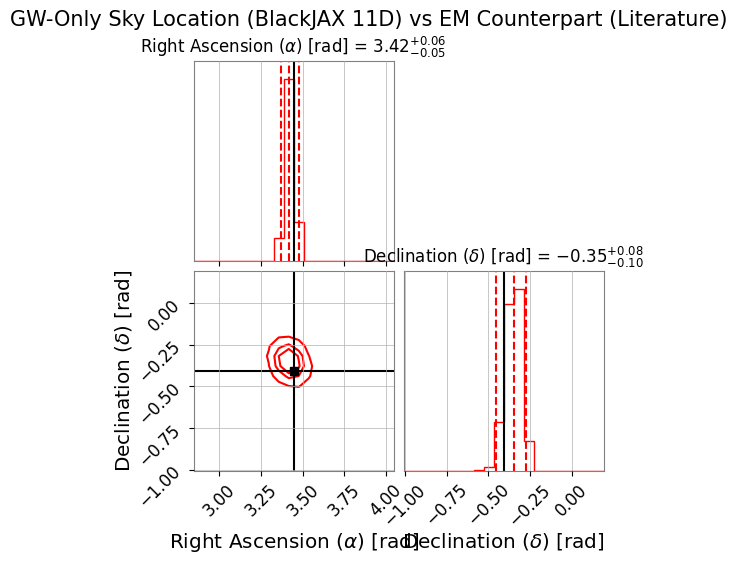

In [ ]:
import corner
import matplotlib.pyplot as plt
import numpy as np

# Extract Right Ascension and Declination from samples_plot
# parameter_names = ['ra', 'dec', 'logdistance', ...]
ra_samples = samples_plot[:, 0]
dec_samples = samples_plot[:, 1]

sky_samples_plot = np.vstack([ra_samples, dec_samples]).T

# Literature values (Optical Counterpart of GW170817)
ra_true = NOT_FIXED_RA
dec_true = NOT_FIXED_DEC

# Range for plotting
plot_ranges_sky = [(ra_true - 0.6, ra_true + 0.6), (dec_true - 0.6, dec_true + 0.6)]

# Generate the corner plot for sky location
fig_sky = corner.corner(
    sky_samples_plot,
    labels=[r'Right Ascension ($\alpha$) [rad]', r'Declination ($\delta$) [rad]'],
    color='red',
    truths=[ra_true, dec_true],        # Overlay the known literature values
    truth_color='black',               # Make the truth lines distinct
    show_titles=True,
    smooth=1,
    range=plot_ranges_sky,
    title_kwargs={"fontsize": 12},
    quantiles=[0.025, 0.5, 0.975],     # Show 95% credible intervals + median
    hist_kwargs={'density': True},
    plot_datapoints=False,
    plot_density=False,
    fill_contours=False,
)

plt.suptitle("GW-Only Sky Location (BlackJAX 11D) vs EM Counterpart (Literature)", fontsize=15, y=1.02)
plt.savefig('sky_location_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


# OLD

In [ ]:
import time
import tqdm
import pickle
import os
import jax
import jax.numpy as jnp

# Adjust the filename if you want to load a different specific checkpoint
manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_25.pkl")

if not os.path.exists(manual_ckpt_path):
    # Fallback to the latest standard checkpoint
    manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_9.pkl")

print(f"Loading checkpoint from {manual_ckpt_path}...")
with open(manual_ckpt_path, "rb") as f:
    ckpt = pickle.load(f)

# Restore state
state = ckpt["state"]
dead = ckpt["dead"]
n_iter = ckpt["n_iter"]
rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

# Ensure terminate function is defined
def terminate(state):
    dlogz = jnp.logaddexp(0, state.logZ_live - state.logZ)
    return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)

In [ ]:
import os
import pickle
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from corner import corner as corner_plot

if 'state' in locals() and 'dead' in locals() and 'n_iter' in locals() and 'rng_key' in locals():
    # 1. Calculate and print dlogz
    dlogz = float(jnp.logaddexp(0, state.logZ_live - state.logZ))
    print(f"--- Iteration {n_iter} ---")
    print(f"Current Δlog Z: {dlogz:.4f} (Target < {DLOGZ_STOP})")

    # 2. Save manual checkpoint
    manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_{n_iter}.pkl")
    ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
    with open(manual_ckpt_path, "wb") as f:
        pickle.dump(ckpt, f)
    print(f"\n✅ Successfully saved manual checkpoint to:\n   {manual_ckpt_path}")

    # 3. Intermediate corner plot (using current live points)
    print(f"\nExtracting {N_LIVE} current live points for intermediate corner plot...")
    curr_phys_particles = transform_to_physical(state.particles, prior_transform_fn)

    # Convert to array using the defined ravel order and extract the columns
    curr_array = np.column_stack([np.array(curr_phys_particles[k]) for k in _ravel_order])
    ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
    curr_samples = curr_array[:, ravel_to_param_idx]

    # Plot Corner
    fig = corner_plot(curr_samples, show_titles=True,
                      labels=parameter_names, title_kwargs={"fontsize": 9})
    fig.suptitle(f"Intermediate Posterior (Live Points) - Iteration {n_iter}\nΔlog Z = {dlogz:.4f}", fontsize=14, y=1.05)
    plt.show()
else:
    print("Required variables ('state', 'dead', 'n_iter', 'rng_key') not found in memory.")


In [ ]:
import time
import tqdm
import pickle
import os

print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
t_start = time.time()

# Resume the loop using the in-memory state
with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint
        if n_iter % CHECKPOINT_EVERY == 0:
            ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")


In [ ]:
import time
import tqdm
import pickle
import os
import glob
import jax
import jax.numpy as jnp

# 1. Find the latest manual checkpoint dynamically
ckpts = glob.glob(os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_*.pkl"))
if ckpts:
    # Sort by the iteration number in the filename
    ckpts.sort(key=lambda x: int(x.split('_iter_')[-1].split('.pkl')[0]))
    manual_ckpt_path = ckpts[-1]
else:
    # Fallback to the standard periodic checkpoint
    manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl")

if not os.path.exists(manual_ckpt_path):
    print(f"No checkpoint found at {manual_ckpt_path}. Cannot resume.")
else:
    print(f"Loading checkpoint from {manual_ckpt_path}...")
    with open(manual_ckpt_path, "rb") as f:
        ckpt = pickle.load(f)

    # Restore state
    state = ckpt["state"]
    dead = ckpt["dead"]
    n_iter = ckpt["n_iter"]
    rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

    # 2. Re-initialize the nested sampler (needed after session restart)
    example_params = {key: 0.0 for key in parameter_names}
    periodic_mask = jax.tree_util.tree_map(lambda _: False, example_params)
    periodic_mask["pol"] = True

    unit_cube_fns = create_unit_cube_functions(
        physical_loglikelihood_fn=loglikelihood_from_dict,
        prior_transform_fn=prior_transform_fn,
        mask_tree=periodic_mask,
    )

    nested_sampler = acceptance_walk_sampler(
        logprior_fn=unit_cube_fns["logprior_fn"],
        loglikelihood_fn=unit_cube_fns["loglikelihood_fn"],
        nlive=N_LIVE,
        n_target=N_TARGET,
        max_mcmc=MAX_MCMC,
        num_delete=N_DELETE,
        stepper_fn=unit_cube_fns["stepper_fn"],
    )

    @jax.jit
    def one_step(carry, xs):
        st, k = carry
        k, subk = jax.random.split(k)
        st, dead_point = nested_sampler.step(subk, st)
        return (st, k), dead_point

    def terminate(st):
        dlogz = jnp.logaddexp(0, st.logZ_live - st.logZ)
        return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)

    print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
    t_start = time.time()

    # 3. Resume the nested sampling loop
    with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
        while not terminate(state):
            (state, rng_key), dead_info = one_step((state, rng_key), None)
            dead.append(dead_info)
            n_iter += 1
            pbar.update(N_DELETE)

            # Periodic auto-checkpoint
            if n_iter % CHECKPOINT_EVERY == 0:
                auto_ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
                with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                    pickle.dump(auto_ckpt, f)

    dt = time.time() - t_start
    n_dead_total = len(dead) * N_DELETE
    print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
    print(f"log Z (running):  {state.logZ:.3f}")
    print(f"log Z (live):     {state.logZ_live:.3f}")
    print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")


In [ ]:
import os
import pickle
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
from corner import corner as corner_plot
from blackjax.ns.utils import finalise
from anesthetic import NestedSamples

# ── Finalise: merge dead + live ──────────────────────────────────────────
final_state = finalise(state, dead)

# ── Save final state ─────────────────────────────────────────────────────
state_path = os.path.join(OUTDIR, f"{LABEL}_final_state.pkl")
with open(state_path, "wb") as f:
    pickle.dump(final_state, f)
print(f"Final state saved: {state_path}")

# ── Transform unit-cube → physical space ─────────────────────────────────
physical_particles = transform_to_physical(final_state.particles, prior_transform_fn)

column_to_label = {
    "logdistance": r"$\ln d_L$", "theta_jn": r"$\theta_{JN}$", "pol": r"$\psi$",
    "mc": r"$\mathcal{M}_c$", "q": r"$q$", "chi1": r"$\chi_1$", "chi2": r"$\chi_2$",
    "lambda_1": r"$\Lambda_1$", "lambda_2": r"$\Lambda_2$",
}

logL_birth = jnp.where(jnp.isnan(final_state.loglikelihood_birth), -jnp.inf, final_state.loglikelihood_birth)

# ── Create and save NestedSamples ────────────────────────────────────────
samples_anesthetic = NestedSamples(
    physical_particles,
    logL=final_state.loglikelihood,
    logL_birth=logL_birth,
    labels=column_to_label,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

csv_path = os.path.join(OUTDIR, f"{LABEL}_posterior.csv")
samples_anesthetic.to_csv(csv_path)
print(f"Posterior samples saved: {csv_path}")

# ── Plot Corner ──────────────────────────────────────────────────────────
# Generate equally-weighted samples
eq_samples = samples_anesthetic.sample(n=5000, replace=True)
eq_array = np.column_stack([np.array(eq_samples[k]) for k in _ravel_order])
ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
samples_plot = eq_array[:, ravel_to_param_idx]

fig = corner_plot(samples_plot, show_titles=True, labels=parameter_names, title_kwargs={"fontsize": 9})
fig.suptitle(f"GW170817 — BlackJAX-NS (tc+φ marginalised, 9-D)", fontsize=14, y=1.01)
corner_path = os.path.join(OUTDIR, f"{LABEL}_corner_final.png")
fig.savefig(corner_path, dpi=150, bbox_inches="tight")
print(f"Corner plot saved: {corner_path}")
plt.show()

In [ ]:
rng_key = jax.random.PRNGKey(SEED)
rng_key, init_key = jax.random.split(rng_key)

example_params = {key: 0.0 for key in parameter_names}

# ── Initialize live points ───────────────────────────────────────────────
unit_cube_particles = init_unit_cube_particles(init_key, example_params, N_LIVE)

# ── Periodic parameter mask (pol is periodic in [0, π]) ─────────────────
periodic_mask = jax.tree_util.tree_map(lambda _: False, example_params)
periodic_mask["pol"] = True

# ── Create unit-cube wrappers ────────────────────────────────────────────
unit_cube_fns = create_unit_cube_functions(
    physical_loglikelihood_fn=loglikelihood_from_dict,
    prior_transform_fn=prior_transform_fn,
    mask_tree=periodic_mask,
)

# ── Build nested sampler ─────────────────────────────────────────────────
nested_sampler = acceptance_walk_sampler(
    logprior_fn=unit_cube_fns["logprior_fn"],
    loglikelihood_fn=unit_cube_fns["loglikelihood_fn"],
    nlive=N_LIVE,
    n_target=N_TARGET,
    max_mcmc=MAX_MCMC,
    num_delete=N_DELETE,
    stepper_fn=unit_cube_fns["stepper_fn"],
)

state = nested_sampler.init(unit_cube_particles)

print(f"BlackJAX-NS configured:")
print(f"  Live points:     {N_LIVE}")
print(f"  Batch delete:    {N_DELETE}")
print(f"  Target walks:    {N_TARGET}")
print(f"  Max MCMC:        {MAX_MCMC}")
print(f"  Stop at ΔlnZ <   {DLOGZ_STOP}")
print(f"  Seed:            {SEED}")

## Run nested sampling

The loop runs until the estimated remaining log-evidence
Δln Z = ln(Z_live / Z) < 0.1.  Each iteration removes `N_DELETE`
dead points and replaces them via the acceptance-walk kernel.

A checkpoint is saved every 200 iterations to `outdir_time_marg_pe/`.

In [ ]:
@jax.jit
def one_step(carry, xs):
    state, k = carry
    k, subk = jax.random.split(k)
    state, dead_point = nested_sampler.step(subk, state)
    return (state, k), dead_point


def terminate(state):
    dlogz = jnp.logaddexp(0, state.logZ_live - state.logZ)
    return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)


print(f"Starting BlackJAX-NS with {N_LIVE} live points (tc+φ-marg, 9-D space)...")
t_start = time.time()
dead    = []
n_iter  = 0

CHECKPOINT_EVERY = 200  # save state every N iterations

with tqdm.tqdm(desc="Dead pts", unit=" pts") as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint
        if n_iter % CHECKPOINT_EVERY == 0:
            ckpt = {"state": state, "dead": dead, "n_iter": n_iter}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s — {n_dead_total} dead points")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")

Starting BlackJAX-NS with 1400 live points (tc+φ-marg, 9-D space)...


Dead pts: 0 pts [00:00, ? pts/s]


NameError: name 'state' is not defined

In [ ]:
state

NSState(particles={'chi1': Array([0.4668281 , 0.40867813, 0.42863959, ..., 0.43141434,
       0.51357763, 0.54395622], dtype=float64), 'chi2': Array([0.57247222, 0.67134021, 0.60115902, ..., 0.58810793,
       0.52274621, 0.4696517 ], dtype=float64), 'lambda_1': Array([0.20691765, 0.06596155, 0.17486733, ..., 0.14119956,
       0.0783925 , 0.2562747 ], dtype=float64), 'lambda_2': Array([0.35106951, 0.11150149, 0.07633872, ..., 0.08303362,
       0.31050735, 0.1541481 ], dtype=float64), 'logdistance': Array([0.82478715, 0.87429409, 0.89618239, ..., 0.88671011,
       0.86097827, 0.74705536], dtype=float64), 'mc': Array([0.58839529, 0.58782118, 0.5897662 , ..., 0.58850612,
       0.5881342 , 0.58948014], dtype=float64), 'pol': Array([4.88884658e-01, 8.36995638e-01, 9.58498942e-01, ...,
       7.57153311e-01, 5.98204079e-01, 7.44648485e-05],      dtype=float64), 'q': Array([0.65366859, 0.53061881, 0.82995515, ..., 0.91985226,
       0.50165172, 0.96045687], dtype=float64), 'theta_jn': Arr

### Checkpoint Recovery
Run the cell below to load the latest checkpoint and check the status of your interrupted run.

In [ ]:
import pickle
import os
import jax
import jax.numpy as jnp

checkpoint_path = os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl")
# Change this to your manual checkpoint path if you want to load that instead!
# checkpoint_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_24.pkl")

if os.path.exists(checkpoint_path):
    with open(checkpoint_path, "rb") as f:
        ckpt = pickle.load(f)

    resumed_state = ckpt["state"]
    resumed_dead = ckpt["dead"]
    resumed_n_iter = ckpt["n_iter"]
    resumed_rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

    n_dead_total_so_far = len(resumed_dead) * N_DELETE
    dlogz = float(jnp.logaddexp(0, resumed_state.logZ_live - resumed_state.logZ))

    print(f"--- Checkpoint Status ---")
    print(f"Iterations:   {resumed_n_iter}")
    print(f"Dead points:  {n_dead_total_so_far}")
    print(f"log Z (run):  {resumed_state.logZ:.3f}")
    print(f"log Z (live): {resumed_state.logZ_live:.3f}")
    print(f"Δlog Z:       {dlogz:.4f} (Target < {DLOGZ_STOP})")
else:
    print(f"No checkpoint found at {checkpoint_path}")

No checkpoint found at outdir_time_marg_pe/GW170817_time_marg_pe_checkpoint.pkl


### Current Status: Live Points Corner Plot & Medians
Run this cell to inspect the current active live points from the interrupted run.

Extracting 1400 current live points at iteration 24 for status check...


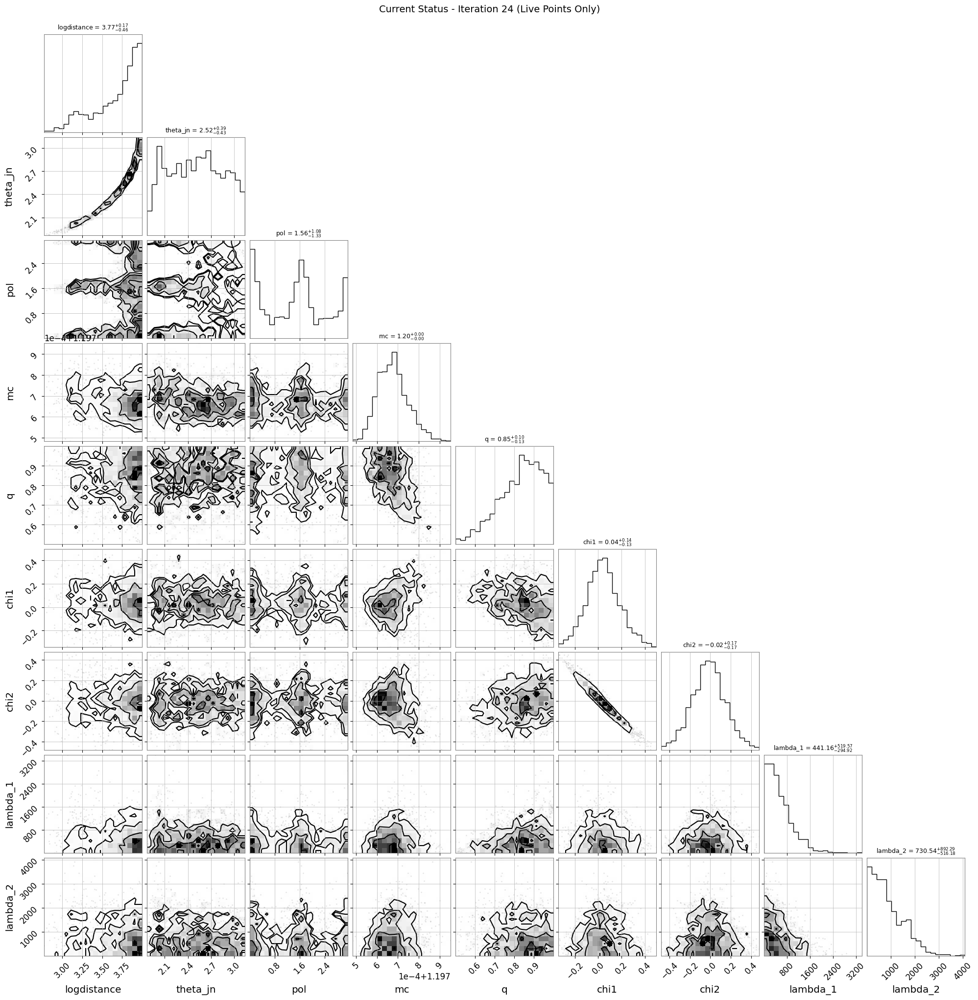


--- Current Live Points: Median ± 90% CI ---
  M_c            : 1.198  [1.198, 1.198]
  q              : 0.846  [0.629, 0.981]
  chi_eff        : 0.016  [0.003, 0.046]
  Lambda_tilde   : 655.098  [217.223, 1194.269]
  D_L            : 43.174  [22.264, 52.765]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from corner import corner as corner_plot

if 'state' in locals() and 'n_iter' in locals():
    print(f"Extracting {N_LIVE} current live points at iteration {n_iter} for status check...")

    # Transform unit-cube live points back to physical space
    curr_phys_particles = transform_to_physical(state.particles, prior_transform_fn)

    # Convert to array using the defined ravel order and extract the columns
    curr_array = np.column_stack([np.array(curr_phys_particles[k]) for k in _ravel_order])
    ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
    curr_samples = curr_array[:, ravel_to_param_idx]

    # 1) Plot Corner
    fig = corner_plot(curr_samples, show_titles=True,
                      labels=parameter_names, title_kwargs={"fontsize": 9})
    fig.suptitle(f"Current Status - Iteration {n_iter} (Live Points Only)", fontsize=14, y=1.01)
    plt.show()

    # 2) Calculate derived parameters for the median table
    # Column order from parameter_names:
    # 0:logdist, 1:theta_jn, 2:pol, 3:mc, 4:q, 5:chi1, 6:chi2, 7:lambda_1, 8:lambda_2
    mc_c      = curr_samples[:, 3]
    q_c       = curr_samples[:, 4]
    chi1_c    = curr_samples[:, 5]
    chi2_c    = curr_samples[:, 6]
    lam1_c    = curr_samples[:, 7]
    lam2_c    = curr_samples[:, 8]
    logdist_c = curr_samples[:, 0]

    chi_eff_c = (chi1_c + q_c * chi2_c) / (1.0 + q_c)
    lambda_tilde_c = (16.0 / 13.0) * (
        (12.0 * q_c + 1.0) * lam1_c + (12.0 + q_c) * q_c**4 * lam2_c
    ) / (1.0 + q_c)**5
    d_L_mpc_c = np.exp(logdist_c)

    print("\n--- Current Live Points: Median ± 90% CI ---")
    for label, col_data in zip(["M_c", "q", "chi_eff", "Lambda_tilde", "D_L"],
                               [mc_c, q_c, chi_eff_c, lambda_tilde_c, d_L_mpc_c]):
        lo, med, hi = np.percentile(col_data, [5, 50, 95])
        print(f"  {label:15s}: {med:.3f}  [{lo:.3f}, {hi:.3f}]")
else:
    print("No state found in memory to plot.")

### Resume Run
If you want to continue the sampling process from the checkpoint, run the cell below.

In [ ]:
import time
import tqdm

if 'resumed_state' in locals():
    # Restore state from loaded disk checkpoint
    state = resumed_state
    dead = resumed_dead
    n_iter = resumed_n_iter
    rng_key = resumed_rng_key
    print("Loaded state from disk checkpoint.")
elif 'state' in locals() and 'n_iter' in locals() and 'dead' in locals():
    # Use the variables still in memory from the interrupted run
    print("Using in-memory state from the interrupted run.")
else:
    raise ValueError("No state to resume from. Please start the run from the beginning.")

print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
t_start = time.time()

# Resume the loop
with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint
        if n_iter % CHECKPOINT_EVERY == 0:
            ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")

Using in-memory state from the interrupted run.
Resuming BlackJAX-NS from iteration 24...


Dead pts: 17500 pts [1:04:09,  5.50s/ pts]


KeyboardInterrupt: 

### Force Manual Checkpoint
Run this cell anytime you interrupt the run to manually save the current progress to disk, ensuring you don't lose anything if the session crashes.

In [ ]:
import pickle
import os

if 'state' in locals() and 'dead' in locals() and 'n_iter' in locals() and 'rng_key' in locals():
    manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_{n_iter}.pkl")

    ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
    with open(manual_ckpt_path, "wb") as f:
        pickle.dump(ckpt, f)

    print(f"✅ Successfully saved manual checkpoint at iteration {n_iter} to:")
    print(f"   {manual_ckpt_path}")
    print("You can load this file later to resume in a new session.")
else:
    print("Could not find 'state', 'dead', 'n_iter', or 'rng_key' in memory to save.")

✅ Successfully saved manual checkpoint at iteration 24 to:
   outdir_time_marg_pe/GW170817_time_marg_pe_manual_checkpoint_iter_24.pkl
You can load this file later to resume in a new session.


### Load and Resume in a New Session
Run this cell if you are returning to a new Colab session and want to load your manual checkpoint to finish the run.

In [ ]:
import time
import tqdm
import pickle
import os
import jax
import jax.numpy as jnp

# Specify the exact path to your manual checkpoint
manual_ckpt_path = os.path.join(OUTDIR, "GW170817_time_marg_pe_manual_checkpoint_iter_25.pkl")

if not os.path.exists(manual_ckpt_path):
    raise FileNotFoundError(f"Checkpoint not found at {manual_ckpt_path}")

print(f"Loading checkpoint from {manual_ckpt_path}...")
with open(manual_ckpt_path, "rb") as f:
    ckpt = pickle.load(f)

# Restore all variables
state = ckpt["state"]
dead = ckpt["dead"]
n_iter = ckpt["n_iter"]
rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
t_start = time.time()

# Resume the loop
with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint (uses the standard auto-checkpoint name)
        if n_iter % CHECKPOINT_EVERY == 0:
            auto_ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(auto_ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")

Loading checkpoint from outdir_time_marg_pe/GW170817_time_marg_pe_manual_checkpoint_iter_25.pkl...
Resuming BlackJAX-NS from iteration 25...


Dead pts: 17500 pts [00:00, ? pts/s]


NameError: name 'terminate' is not defined

### Force Manual Checkpoint (Recreated)
Run this cell anytime you interrupt the run to manually save the current progress to disk, ensuring you don't lose anything if the session crashes.

In [ ]:
import pickle
import os

if 'state' in locals() and 'dead' in locals() and 'n_iter' in locals() and 'rng_key' in locals():
    manual_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_{n_iter}.pkl")

    ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
    with open(manual_ckpt_path, "wb") as f:
        pickle.dump(ckpt, f)

    print(f"\u2705 Successfully saved manual checkpoint at iteration {n_iter} to:")
    print(f"   {manual_ckpt_path}")
    print("You can load this file later to resume in a new session.")
else:
    print("Could not find 'state', 'dead', 'n_iter', or 'rng_key' in memory to save.")

✅ Successfully saved manual checkpoint at iteration 25 to:
   outdir_time_marg_pe/GW170817_time_marg_pe_manual_checkpoint_iter_25.pkl
You can load this file later to resume in a new session.


In [ ]:
import jax.numpy as jnp

if 'state' in locals():
    dlogz = float(jnp.logaddexp(0, state.logZ_live - state.logZ))
    print(f"Current Δlog Z: {dlogz:.4f}")
    print(f"Target Δlog Z:  {DLOGZ_STOP}")
else:
    print("State not found. Cannot calculate dlogz.")

Current Δlog Z: 0.2206
Target Δlog Z:  0.1


In [ ]:
!pip install -q corner
import numpy as np
import matplotlib.pyplot as plt
import jax.numpy as jnp
from corner import corner as corner_plot

if 'state' in locals() and 'n_iter' in locals():
    # Calculate dlogz
    dlogz = float(jnp.logaddexp(0, state.logZ_live - state.logZ))
    print(f"--- Iteration {n_iter} ---")
    print(f"Current Δlog Z: {dlogz:.4f} (Target < {DLOGZ_STOP})")

    print(f"Extracting {N_LIVE} current live points for corner plot...")

    # Transform unit-cube live points back to physical space
    curr_phys_particles = transform_to_physical(state.particles, prior_transform_fn)

    # Convert to array using the defined ravel order and extract the columns
    curr_array = np.column_stack([np.array(curr_phys_particles[k]) for k in _ravel_order])
    ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
    curr_samples = curr_array[:, ravel_to_param_idx]

    # Plot Corner
    fig = corner_plot(curr_samples, show_titles=True,
                      labels=parameter_names, title_kwargs={"fontsize": 9})
    fig.suptitle(f"Current Status - Iteration {n_iter} (Δlog Z = {dlogz:.4f})", fontsize=14, y=1.01)
    plt.show()
else:
    print("No state found in memory to plot.")

No state found in memory to plot.


In [ ]:
import time
import tqdm
import pickle
import os

print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
t_start = time.time()

# Resume the loop
with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
    while not terminate(state):
        (state, rng_key), dead_info = one_step((state, rng_key), None)
        dead.append(dead_info)
        n_iter += 1
        pbar.update(N_DELETE)

        # Periodic checkpoint
        if n_iter % CHECKPOINT_EVERY == 0:
            ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
            with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                pickle.dump(ckpt, f)

dt = time.time() - t_start
n_dead_total = len(dead) * N_DELETE
print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
print(f"log Z (running):  {state.logZ:.3f}")
print(f"log Z (live):     {state.logZ_live:.3f}")
print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")

Resuming BlackJAX-NS from iteration 25...


Dead pts: 17500 pts [00:00, ? pts/s]

In [ ]:
from blackjax.ns.utils import finalise
from anesthetic import NestedSamples

# ── Finalise: merge dead + live ──────────────────────────────────────────
final_state = finalise(state, dead)

# ── Save ─────────────────────────────────────────────────────────────────
state_path = os.path.join(OUTDIR, f"{LABEL}_final_state.pkl")
with open(state_path, "wb") as f:
    pickle.dump(final_state, f)
print(f"Final state saved: {state_path}")

# ── Transform unit-cube → physical space ─────────────────────────────────
physical_particles = transform_to_physical(final_state.particles, prior_transform_fn)

# ── Column labels for anesthetic ─────────────────────────────────────────
column_to_label = {
    "logdistance": r"$\ln d_L$",
    "theta_jn":    r"$\theta_{JN}$",
    "pol":         r"$\psi$",
    "mc":          r"$\mathcal{M}_c$",
    "q":           r"$q$",
    "chi1":        r"$\chi_1$",
    "chi2":        r"$\chi_2$",
    "lambda_1":    r"$\Lambda_1$",
    "lambda_2":    r"$\Lambda_2$",
}

logL_birth = final_state.loglikelihood_birth.copy()
logL_birth = jnp.where(jnp.isnan(logL_birth), -jnp.inf, logL_birth)

samples_anesthetic = NestedSamples(
    physical_particles,
    logL=final_state.loglikelihood,
    logL_birth=logL_birth,
    labels=column_to_label,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

csv_path = os.path.join(OUTDIR, f"{LABEL}_posterior.csv")
samples_anesthetic.to_csv(csv_path)
print(f"Posterior samples saved: {csv_path}")

logZ_samples = samples_anesthetic.logZ(100)
print(f"\nBayesian evidence:")
print(f"  ln Z (integrator): {state.logZ:.3f}")
print(f"  ln Z (anesthetic): {logZ_samples.mean():.3f} ± {logZ_samples.std():.3f}")
print(f"  Dead points:       {n_dead_total}")

In [ ]:
from corner import corner as corner_plot

# ── Build equally-weighted sample array ──────────────────────────────────
eq_samples  = samples_anesthetic.sample(n=5000, replace=True)
eq_array    = np.column_stack([np.array(eq_samples[k]) for k in _ravel_order])
ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
samples = eq_array[:, ravel_to_param_idx]

print(f"Equally-weighted samples: {samples.shape}")
print(f"Columns: {parameter_names}")

# ── Full corner plot ──────────────────────────────────────────────────────
fig = corner_plot(samples, show_titles=True,
                  labels=parameter_names, title_kwargs={"fontsize": 9})
fig.suptitle("GW170817 — BlackJAX-NS (tc+φ marginalised, 9-D)", fontsize=14, y=1.01)
corner_path = os.path.join(OUTDIR, f"{LABEL}_corner_full.png")
fig.savefig(corner_path, dpi=150, bbox_inches="tight")
print(f"Corner plot saved: {corner_path}")
plt.show()

## Paper-style results (Figure 9 of arXiv:2210.15684)

Compute derived parameters and compare with the paper's MAP values:
- M_c = 1.1975 M☉
- q ≈ 0.87
- χ_eff ≈ 0.0
- Λ̃ ≈ 300–400
- D_L ≈ 40 Mpc

Column map for the 9-dim samples array:
`[0] logdist, [1] theta_jn, [2] pol, [3] mc, [4] q, [5] chi1, [6] chi2, [7] lambda_1, [8] lambda_2`

Paper-style corner saved to outdir_time_marg_pe/GW170817_time_marg_pe_corner_paper.png


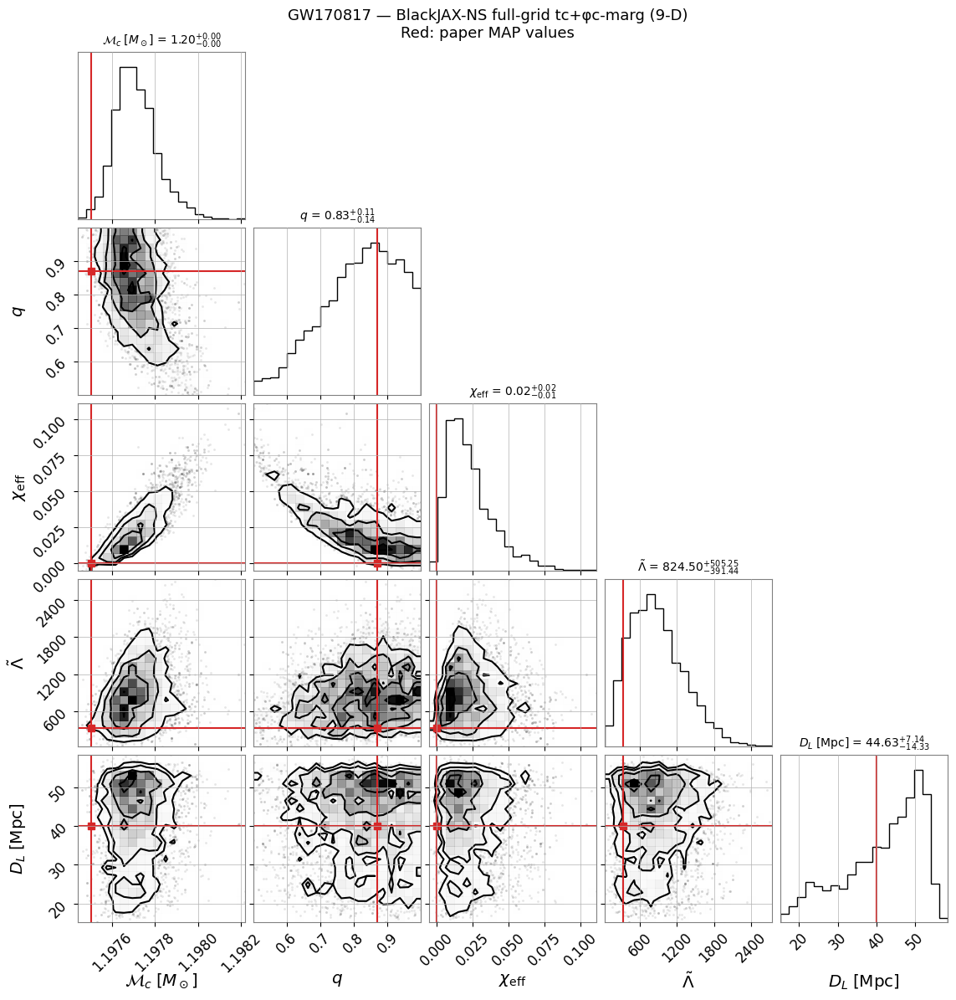


Median ± 90% CI (5th–95th percentiles):
  M_c            : 1.198  [1.198, 1.198]
  q              : 0.831  [0.608, 0.979]
  chi_eff        : 0.019  [0.004, 0.056]
  Lambda_tilde   : 824.504  [258.601, 1669.445]
  D_L            : 44.635  [22.360, 53.525]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from corner import corner as corner_plot

# ── Derived parameters ────────────────────────────────────────────────
# Columns from parameter_names (9 sampled, tc+φc analytically marginalized):
# [0] logdist, [1] theta_jn, [2] pol, [3] mc, [4] q,
# [5] chi1,   [6] chi2,     [7] lambda_1, [8] lambda_2

mc_samples = samples_plot[:, 3]
q_samples  = samples_plot[:, 4]

# Effective spin
chi_eff = (samples_plot[:, 5] + q_samples * samples_plot[:, 6]) / (1.0 + q_samples)

# Reduced tidal deformability
lambda_tilde = (16.0 / 13.0) * (
    (12.0 * q_samples + 1.0) * samples_plot[:, 7]
    + (12.0 + q_samples) * q_samples**4 * samples_plot[:, 8]
) / (1.0 + q_samples)**5

# Luminosity distance
d_L = np.exp(samples_plot[:, 0])

paper_samples = np.column_stack([mc_samples, q_samples, chi_eff, lambda_tilde, d_L])
paper_labels = [
    r"$\mathcal{M}_c\;[M_\odot]$",
    r"$q$",
    r"$\chi_\mathrm{eff}$",
    r"$\tilde{\Lambda}$",
    r"$D_L\;[\mathrm{Mpc}]$",
]

# Paper MAP truths (arXiv:2210.15684, Table I)
truths = [1.1975, 0.87, 0.0, 330.0, 40.0]

fig = corner_plot(
    paper_samples, labels=paper_labels,
    show_titles=True, title_kwargs={"fontsize": 10},
    truths=truths, truth_color="tab:red",
)
fig.suptitle(
    "GW170817 — BlackJAX-NS full-grid tc+φc-marg (9-D)\nRed: paper MAP values",
    fontsize=13, y=1.01,
)
plot_path = os.path.join(OUTDIR, f"{LABEL}_corner_paper.png")
fig.savefig(plot_path, dpi=150, bbox_inches="tight")
print(f"Paper-style corner saved to {plot_path}")
plt.show()

# ── Print median and 90% CI ──────────────────────────────────────────
print("\nMedian ± 90% CI (5th–95th percentiles):")
for label, col_data in zip(
    ["M_c", "q", "chi_eff", "Lambda_tilde", "D_L"],
    [mc_samples, q_samples, chi_eff, lambda_tilde, d_L],
):
    lo, med, hi = np.percentile(col_data, [5, 50, 95])
    print(f"  {label:15s}: {med:.3f}  [{lo:.3f}, {hi:.3f}]")


In [ ]:
print("=" * 70)
print("SUMMARY — GW170817 BlackJAX-NS (tc+φ marginalized)")
print("=" * 70)
print(f"\nData:     BayesWave-cleaned, 128 s, {SAMPLING_RATE} Hz")
print(f"Waveform: mlgw_bns_jax")
print(f"tc grid:  {N_TC} pts in [{TC_MIN}, {TC_MAX}] s")
print(f"RB bins:  {len(np.array(rb_network.f_bins))} (of {len(np.array(batched_detector.Frequency[0]))} full-grid pts)")
print(f"\nSampler:  BlackJAX acceptance-walk nested sampling")
print(f"Dims:     {n_dims} (tc + φc analytically marginalized)")
print(f"Live pts: {N_LIVE}, batch: {N_DELETE}")
print(f"\nResults:")
print(f"  ln Z = {state.logZ:.3f}")
print(f"  Dead pts: {n_dead_total}")
print(f"  Wall time: {dt:.1f} s ({dt/3600:.2f} h)")
print(f"\nPosterior medians (50th percentile):")
for lbl, arr in [("M_c [M_sun]", mc_s), ("q", q_s), ("chi_eff", chi_eff),
                  ("Lambda_tilde", lambda_tilde), ("D_L [Mpc]", d_L_mpc)]:
    print(f"  {lbl:20s}: {np.median(arr):.3f}")

In [ ]:
import os
import shutil
import sys

if "google.colab" in sys.modules:
    from google.colab import drive

    # Mount Google Drive
    drive.mount('/content/drive')

    # Define the destination path in Google Drive
    drive_path = '/content/drive/MyDrive/GW170817_BlackJAX_Results'
    os.makedirs(drive_path, exist_ok=True)

    print(f"\nCopying results from {OUTDIR} to {drive_path}...")
    # Copy the contents
    shutil.copytree(OUTDIR, drive_path, dirs_exist_ok=True)
    print("\u2705 Success! All results have been saved to your Google Drive.")
else:
    print("Not running in Colab. Results are already in your local output directory.")


Mounted at /content/drive

Copying results from outdir_time_marg_pe to /content/drive/MyDrive/GW170817_BlackJAX_Results...
✅ Success! All results have been saved to your Google Drive.


In [ ]:
import time
import tqdm
import pickle
import os
import glob
import jax
import jax.numpy as jnp

# 1. Find the latest manual or auto checkpoint dynamically
ckpts = glob.glob(os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_*.pkl"))
if ckpts:
    # Sort by the iteration number in the filename
    ckpts.sort(key=lambda x: int(x.split('_iter_')[-1].split('.pkl')[0]))
    latest_ckpt_path = ckpts[-1]
else:
    # Fallback to the standard periodic checkpoint
    latest_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl")

if not os.path.exists(latest_ckpt_path):
    print(f"No checkpoint found at {latest_ckpt_path}. Cannot resume.")
else:
    print(f"Loading checkpoint from {latest_ckpt_path}...")
    with open(latest_ckpt_path, "rb") as f:
        ckpt = pickle.load(f)

    # Restore state
    state = ckpt["state"]
    dead = ckpt["dead"]
    n_iter = ckpt["n_iter"]
    rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

    # 2. Re-initialize the nested sampler (essential if the kernel restarted)
    example_params = {key: 0.0 for key in parameter_names}
    periodic_mask = jax.tree_util.tree_map(lambda _: False, example_params)
    periodic_mask["pol"] = True

    unit_cube_fns = create_unit_cube_functions(
        physical_loglikelihood_fn=loglikelihood_from_dict,
        prior_transform_fn=prior_transform_fn,
        mask_tree=periodic_mask,
    )

    nested_sampler = acceptance_walk_sampler(
        logprior_fn=unit_cube_fns["logprior_fn"],
        loglikelihood_fn=unit_cube_fns["loglikelihood_fn"],
        nlive=N_LIVE,
        n_target=N_TARGET,
        max_mcmc=MAX_MCMC,
        num_delete=N_DELETE,
        stepper_fn=unit_cube_fns["stepper_fn"],
    )

    @jax.jit
    def one_step(carry, xs):
        st, k = carry
        k, subk = jax.random.split(k)
        st, dead_point = nested_sampler.step(subk, st)
        return (st, k), dead_point

    def terminate(st):
        dlogz = jnp.logaddexp(0, st.logZ_live - st.logZ)
        return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)

    print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
    t_start = time.time()

    # 3. Resume the nested sampling loop
    with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
        while not terminate(state):
            (state, rng_key), dead_info = one_step((state, rng_key), None)
            dead.append(dead_info)
            n_iter += 1
            pbar.update(N_DELETE)

            # Periodic auto-checkpoint
            if n_iter % CHECKPOINT_EVERY == 0:
                auto_ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
                with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                    pickle.dump(auto_ckpt, f)

    dt = time.time() - t_start
    n_dead_total = len(dead) * N_DELETE
    print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
    print(f"log Z (running):  {state.logZ:.3f}")
    print(f"log Z (live):     {state.logZ_live:.3f}")
    print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")


Loading checkpoint from outdir_time_marg_pe_4/GW170817_time_marg_pe_4_manual_checkpoint_iter_13.pkl...
Resuming BlackJAX-NS from iteration 13...


Dead pts: 13300 pts [2:28:11,  2.12s/ pts]


KeyboardInterrupt: 

In [ ]:
import time
import tqdm
import pickle
import os
import glob
import jax
import jax.numpy as jnp

# 1. Find the latest manual or auto checkpoint dynamically
ckpts = glob.glob(os.path.join(OUTDIR, f"{LABEL}_manual_checkpoint_iter_*.pkl"))
if ckpts:
    # Sort by the iteration number in the filename
    ckpts.sort(key=lambda x: int(x.split('_iter_')[-1].split('.pkl')[0]))
    latest_ckpt_path = ckpts[-1]
else:
    # Fallback to the standard periodic checkpoint
    latest_ckpt_path = os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl")

if not os.path.exists(latest_ckpt_path):
    print(f"No checkpoint found at {latest_ckpt_path}. Cannot resume.")
else:
    print(f"Loading checkpoint from {latest_ckpt_path}...")
    with open(latest_ckpt_path, "rb") as f:
        ckpt = pickle.load(f)

    # Restore state
    state = ckpt["state"]
    dead = ckpt["dead"]
    n_iter = ckpt["n_iter"]
    rng_key = ckpt.get("rng_key", jax.random.PRNGKey(SEED))

    # 2. Re-initialize the nested sampler (essential if the kernel restarted)
    example_params = {key: 0.0 for key in parameter_names}
    periodic_mask = jax.tree_util.tree_map(lambda _: False, example_params)
    periodic_mask["pol"] = True

    unit_cube_fns = create_unit_cube_functions(
        physical_loglikelihood_fn=loglikelihood_from_dict,
        prior_transform_fn=prior_transform_fn,
        mask_tree=periodic_mask,
    )

    nested_sampler = acceptance_walk_sampler(
        logprior_fn=unit_cube_fns["logprior_fn"],
        loglikelihood_fn=unit_cube_fns["loglikelihood_fn"],
        nlive=N_LIVE,
        n_target=N_TARGET,
        max_mcmc=MAX_MCMC,
        num_delete=N_DELETE,
        stepper_fn=unit_cube_fns["stepper_fn"],
    )

    @jax.jit
    def one_step(carry, xs):
        st, k = carry
        k, subk = jax.random.split(k)
        st, dead_point = nested_sampler.step(subk, st)
        return (st, k), dead_point

    def terminate(st):
        dlogz = jnp.logaddexp(0, st.logZ_live - st.logZ)
        return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)

    print(f"Resuming BlackJAX-NS from iteration {n_iter}...")
    t_start = time.time()

    # 3. Resume the nested sampling loop
    with tqdm.tqdm(desc="Dead pts", unit=" pts", initial=n_iter * N_DELETE) as pbar:
        while not terminate(state):
            (state, rng_key), dead_info = one_step((state, rng_key), None)
            dead.append(dead_info)
            n_iter += 1
            pbar.update(N_DELETE)

            # Periodic auto-checkpoint
            if n_iter % CHECKPOINT_EVERY == 0:
                auto_ckpt = {"state": state, "dead": dead, "n_iter": n_iter, "rng_key": rng_key}
                with open(os.path.join(OUTDIR, f"{LABEL}_checkpoint.pkl"), "wb") as f:
                    pickle.dump(auto_ckpt, f)

    dt = time.time() - t_start
    n_dead_total = len(dead) * N_DELETE
    print(f"\nDone in {dt:.1f} s (resumed session) — {n_dead_total} dead points total")
    print(f"log Z (running):  {state.logZ:.3f}")
    print(f"log Z (live):     {state.logZ_live:.3f}")
    print(f"Δlog Z:           {float(jnp.logaddexp(0, state.logZ_live - state.logZ)):.4f}")


Loading checkpoint from outdir_time_marg_pe_4/GW170817_time_marg_pe_4_manual_checkpoint_iter_19.pkl...
Resuming BlackJAX-NS from iteration 19...


Dead pts: 18200 pts [2:28:13,  1.82s/ pts]


Done in 8893.8 s (resumed session) — 18200 dead points total
log Z (running):  -377787.930
log Z (live):     -377790.427
Δlog Z:           0.0791


Finalising nested sampling state...
Posterior samples saved to: outdir_time_marg_pe_4/GW170817_time_marg_pe_4_posterior.csv

Bayesian evidence:
  ln Z (integrator): -377787.930
  ln Z (anesthetic): -377787.845 ± 0.113

Plotting full corner plot...


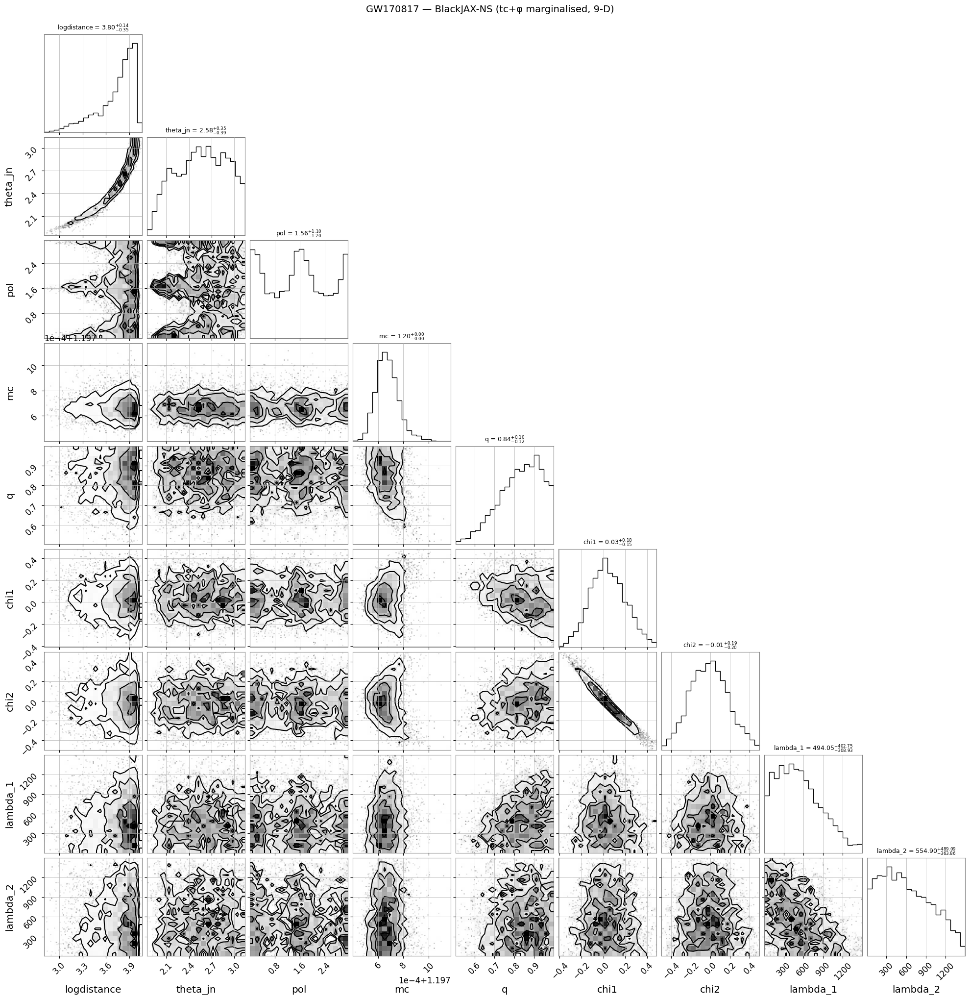

Plotting paper-style derived parameters corner plot...


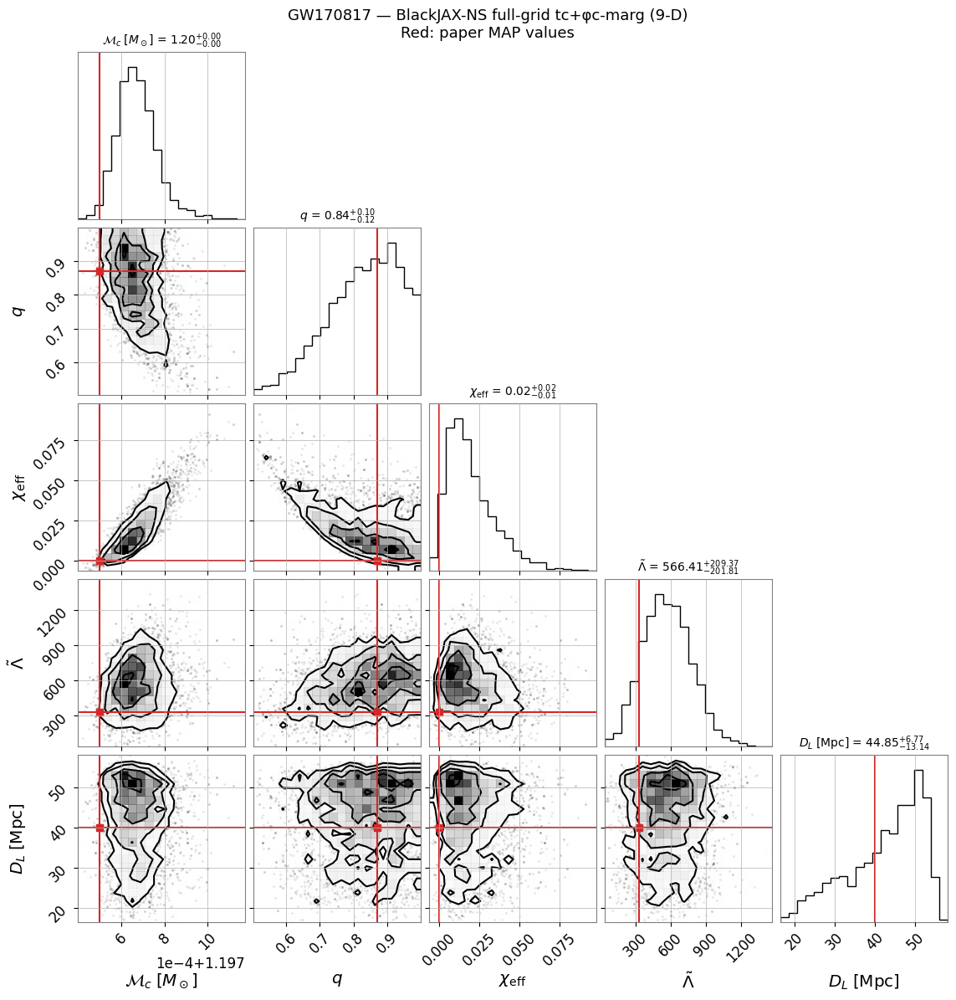

Mounted at /content/drive

Copying results from outdir_time_marg_pe_4 to /content/drive/MyDrive/GW170817_BlackJAX_Results...
✅ Success! All results have been saved to your Google Drive.


In [ ]:
from blackjax.ns.utils import finalise
from anesthetic import NestedSamples
from corner import corner as corner_plot
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
import shutil
import pickle
import jax.numpy as jnp

# ── 1. Finalise state & Save ──────────────────────────
print("Finalising nested sampling state...")
final_state = finalise(state, dead)

state_path = os.path.join(OUTDIR, f"{LABEL}_final_state.pkl")
with open(state_path, "wb") as f:
    pickle.dump(final_state, f)

# ── 2. Transform to Physical & NestedSamples ──────────────
physical_particles = transform_to_physical(final_state.particles, prior_transform_fn)

column_to_label = {
    "logdistance": r"$\ln d_L$", "theta_jn": r"$\theta_{JN}$", "pol": r"$\psi$",
    "mc": r"$\mathcal{M}_c$", "q": r"$q$", "chi1": r"$\chi_1$", "chi2": r"$\chi_2$",
    "lambda_1": r"$\Lambda_1$", "lambda_2": r"$\Lambda_2$",
}

logL_birth = final_state.loglikelihood_birth.copy()
logL_birth = jnp.where(jnp.isnan(logL_birth), -jnp.inf, logL_birth)

samples_anesthetic = NestedSamples(
    physical_particles,
    logL=final_state.loglikelihood,
    logL_birth=logL_birth,
    labels=column_to_label,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

csv_path = os.path.join(OUTDIR, f"{LABEL}_posterior.csv")
samples_anesthetic.to_csv(csv_path)
print(f"Posterior samples saved to: {csv_path}")

logZ_samples = samples_anesthetic.logZ(100)
print(f"\nBayesian evidence:")
print(f"  ln Z (integrator): {state.logZ:.3f}")
print(f"  ln Z (anesthetic): {logZ_samples.mean():.3f} ± {logZ_samples.std():.3f}")

# ── 3. Generate Full Corner Plot ────────────────────────
print("\nPlotting full corner plot...")
eq_samples = samples_anesthetic.sample(n=5000, replace=True)
eq_array = np.column_stack([np.array(eq_samples[k]) for k in _ravel_order])
ravel_to_param_idx = [_ravel_order.index(k) for k in parameter_names]
samples_plot = eq_array[:, ravel_to_param_idx]

fig1 = corner_plot(samples_plot, show_titles=True, labels=parameter_names, title_kwargs={"fontsize": 9})
fig1.suptitle("GW170817 — BlackJAX-NS (tc+φ marginalised, 9-D)", fontsize=14, y=1.01)
full_corner_path = os.path.join(OUTDIR, f"{LABEL}_corner_full.png")
fig1.savefig(full_corner_path, dpi=150, bbox_inches="tight")
plt.show()

# ── 4. Generate Paper-Style Corner Plot ─────────────────
print("Plotting paper-style derived parameters corner plot...")
mc_samples = samples_plot[:, 3]
q_samples  = samples_plot[:, 4]
chi_eff = (samples_plot[:, 5] + q_samples * samples_plot[:, 6]) / (1.0 + q_samples)
lambda_tilde = (16.0 / 13.0) * (
    (12.0 * q_samples + 1.0) * samples_plot[:, 7]
    + (12.0 + q_samples) * q_samples**4 * samples_plot[:, 8]
) / (1.0 + q_samples)**5
d_L = np.exp(samples_plot[:, 0])

paper_samples = np.column_stack([mc_samples, q_samples, chi_eff, lambda_tilde, d_L])
paper_labels = [
    r"$\mathcal{M}_c\;[M_\odot]$", r"$q$", r"$\chi_\mathrm{eff}$",
    r"$\tilde{\Lambda}$", r"$D_L\;[\mathrm{Mpc}]$"
]
truths = [1.1975, 0.87, 0.0, 330.0, 40.0]

fig2 = corner_plot(paper_samples, labels=paper_labels, show_titles=True, title_kwargs={"fontsize": 10}, truths=truths, truth_color="tab:red")
fig2.suptitle("GW170817 — BlackJAX-NS full-grid tc+φc-marg (9-D)\nRed: paper MAP values", fontsize=13, y=1.01)
paper_plot_path = os.path.join(OUTDIR, f"{LABEL}_corner_paper.png")
fig2.savefig(paper_plot_path, dpi=150, bbox_inches="tight")
plt.show()

# ── 5. Save Results to Google Drive ─────────────────────
if "google.colab" in sys.modules:
    from google.colab import drive
    drive.mount('/content/drive')
    drive_path = '/content/drive/MyDrive/GW170817_BlackJAX_Results'
    os.makedirs(drive_path, exist_ok=True)
    print(f"\nCopying results from {OUTDIR} to {drive_path}...")
    shutil.copytree(OUTDIR, drive_path, dirs_exist_ok=True)
    print("\u2705 Success! All results have been saved to your Google Drive.")
else:
    print("\nNot running in Colab. Results are already in your local output directory.")


## Parameter Estimation including Sky Position (ra, dec)

In this section, we relax the assumption of a perfectly known sky location and allow the sampler to infer Right Ascension (`ra`) and Declination (`dec`). We set a small prior ($\pm 0.1$ radians) around their known literature values for NGC 4993 to verify the recovery.

In [ ]:
# ── Parameter names (11, with tc and phic analytically marginalized) ──────
parameter_names_sky = [
    "ra", "dec", "logdistance", "theta_jn", "pol",
    "mc", "q", "chi1", "chi2", "lambda_1", "lambda_2",
]

# Small prior around literature values
delta_sky = 0.6
param_bounds_sky = {
    "ra":          (NOT_FIXED_RA - delta_sky,  NOT_FIXED_RA + delta_sky),
    "dec":         (NOT_FIXED_DEC - delta_sky, NOT_FIXED_DEC + delta_sky),
    "logdistance": (jnp.log(1.0),   jnp.log(75.0)),
    "theta_jn":    (0.0,             jnp.pi),
    "pol":         (0.0,             jnp.pi),
    "mc":          (1.19,            1.20),
    "q":           (0.5,             1.0),
    "chi1":        (-0.5,            0.5),
    "chi2":        (-0.5,            0.5),
    "lambda_1":    (5.0,             1000.0),
    "lambda_2":    (5.0,             1000.0),
}

def loglikelihood_from_dict_sky(params_dict):
    """Map 11-param BlackJAX-NS dict → 11-param array → tc+φ-marg RB log L."""
    params_11 = jnp.array([
        params_dict["ra"],               # [0]
        params_dict["dec"],              # [1]
        params_dict["logdistance"],      # [2]
        params_dict["theta_jn"],         # [3]
        params_dict["pol"],              # [4]
        params_dict["mc"],               # [5]
        params_dict["q"],                # [6]
        params_dict["chi1"],             # [7]
        params_dict["chi2"],             # [8]
        params_dict["lambda_1"],         # [9]
        params_dict["lambda_2"],         # [10]
    ])
    return log_L_tp_marg_rb_jit(params_11)

# Determine JAX's ravel order
_example_sky = {key: float(i) for i, key in enumerate(parameter_names_sky)}
_flat_sky, _ = jax.flatten_util.ravel_pytree(_example_sky)
_ravel_order_sky = []
for val in _flat_sky:
    for key, test_val in _example_sky.items():
        if abs(val - test_val) < 1e-10:
            _ravel_order_sky.append(key)
            break

@jax.jit
def prior_transform_fn_sky(u_params):
    x_params = {}
    for k in parameter_names_sky:
        u_val = u_params[k]
        if k == "logdistance":
            # Volumetric prior: p(d) ~ d^2
            d_min = jnp.exp(param_bounds_sky[k][0])
            d_max = jnp.exp(param_bounds_sky[k][1])
            d_val = (d_min**3 + u_val * (d_max**3 - d_min**3))**(1/3)
            x_params[k] = jnp.log(d_val)
        elif k == "theta_jn":
            # Uniform prior in cos(theta)
            cos_min = jnp.cos(param_bounds_sky[k][0])
            cos_max = jnp.cos(param_bounds_sky[k][1])
            cos_val = cos_min + u_val * (cos_max - cos_min)
            x_params[k] = jnp.arccos(cos_val)
        else:
            # Uniform prior for other parameters
            x_params[k] = param_bounds_sky[k][0] + u_val * (param_bounds_sky[k][1] - param_bounds_sky[k][0])
    return x_params

print(f"Sampling {len(parameter_names_sky)} parameters: {parameter_names_sky}")


Sampling 11 parameters: ['ra', 'dec', 'logdistance', 'theta_jn', 'pol', 'mc', 'q', 'chi1', 'chi2', 'lambda_1', 'lambda_2']


In [ ]:
rng_key_sky = jax.random.PRNGKey(SEED + 1)
rng_key_sky, init_key_sky = jax.random.split(rng_key_sky)

example_params_sky = {key: 0.0 for key in parameter_names_sky}
unit_cube_particles_sky = init_unit_cube_particles(init_key_sky, example_params_sky, N_LIVE)

periodic_mask_sky = jax.tree_util.tree_map(lambda _: False, example_params_sky)
periodic_mask_sky["pol"] = True
periodic_mask_sky["ra"] = True  # ra is technically periodic [0, 2pi]

unit_cube_fns_sky = create_unit_cube_functions(
    physical_loglikelihood_fn=loglikelihood_from_dict_sky,
    prior_transform_fn=prior_transform_fn_sky,
    mask_tree=periodic_mask_sky,
)

nested_sampler_sky = acceptance_walk_sampler(
    logprior_fn=unit_cube_fns_sky["logprior_fn"],
    loglikelihood_fn=unit_cube_fns_sky["loglikelihood_fn"],
    nlive=N_LIVE,
    n_target=N_TARGET,
    max_mcmc=MAX_MCMC,
    num_delete=N_DELETE,
    stepper_fn=unit_cube_fns_sky["stepper_fn"],
)

state_sky = nested_sampler_sky.init(unit_cube_particles_sky)
print("BlackJAX-NS configured for sky inference.")

BlackJAX-NS configured for sky inference.


In [ ]:
@jax.jit
def one_step_sky(carry, xs):
    state, k = carry
    k, subk = jax.random.split(k)
    state, dead_point = nested_sampler_sky.step(subk, state)
    return (state, k), dead_point

def terminate_sky(state):
    dlogz = jnp.logaddexp(0, state.logZ_live - state.logZ)
    return bool(jnp.isfinite(dlogz) and dlogz < DLOGZ_STOP)

print(f"Starting BlackJAX-NS with {N_LIVE} live points (11-D space)...")
t_start_sky = time.time()
dead_sky = []
n_iter_sky = 0

with tqdm.tqdm(desc="Dead pts", unit=" pts") as pbar:
    while not terminate_sky(state_sky):
        (state_sky, rng_key_sky), dead_info = one_step_sky((state_sky, rng_key_sky), None)
        dead_sky.append(dead_info)
        n_iter_sky += 1
        pbar.update(N_DELETE)

dt_sky = time.time() - t_start_sky
print(f"\nDone in {dt_sky:.1f} s \u2014 {len(dead_sky) * N_DELETE} dead points")
print(f"Δlog Z: {float(jnp.logaddexp(0, state_sky.logZ_live - state_sky.logZ)):.4f}")

Starting BlackJAX-NS with 18000 live points (11-D space)...


Dead pts: 176000 pts [19:14, 152.48 pts/s]


Done in 1154.3 s — 176000 dead points
Δlog Z: 0.1701


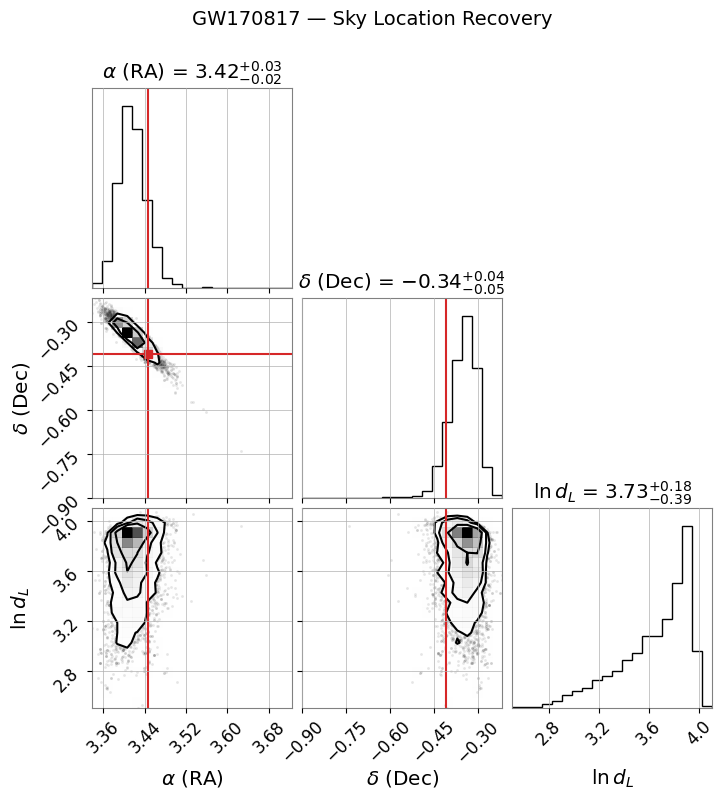

In [ ]:
# Finalise and Plot Results
final_state_sky = finalise(state_sky, dead_sky)
physical_particles_sky = transform_to_physical(final_state_sky.particles, prior_transform_fn_sky)

logL_birth_sky = final_state_sky.loglikelihood_birth.copy()
logL_birth_sky = jnp.where(jnp.isnan(logL_birth_sky), -jnp.inf, logL_birth_sky)

column_to_label_sky = {
    "ra": r"$\alpha$", "dec": r"$\delta$",
    "logdistance": r"$\ln d_L$", "theta_jn": r"$\theta_{JN}$", "pol": r"$\psi$",
    "mc": r"$\mathcal{M}_c$", "q": r"$q$", "chi1": r"$\chi_1$", "chi2": r"$\chi_2$",
    "lambda_1": r"$\Lambda_1$", "lambda_2": r"$\Lambda_2$",
}

samples_anesthetic_sky = NestedSamples(
    physical_particles_sky,
    logL=final_state_sky.loglikelihood,
    logL_birth=logL_birth_sky,
    labels=column_to_label_sky,
    logzero=jnp.nan,
    dtype=jnp.float64,
)

# Corner plot for sky parameters specifically
eq_samples_sky = samples_anesthetic_sky.sample(n=5000, replace=True)

sky_samples = np.column_stack([
    np.array(eq_samples_sky["ra"]),
    np.array(eq_samples_sky["dec"]),
    np.array(eq_samples_sky["logdistance"])
])

fig_sky = corner_plot(
    sky_samples,
    labels=[r"$\alpha$ (RA)", r"$\delta$ (Dec)", r"$\ln d_L$"],
    truths=[FIXED_RA, FIXED_DEC, None],
    truth_color="tab:red",
    show_titles=True
)
fig_sky.suptitle("GW170817 — Sky Location Recovery", fontsize=14, y=1.05)
plt.show()

### Save 11-D Sky Inference Results & Full Corner Plot

Final state saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_final_state.pkl
Posterior samples saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_posterior.csv

Plotting full 11-D corner plot...
Full corner plot saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_corner_full.png


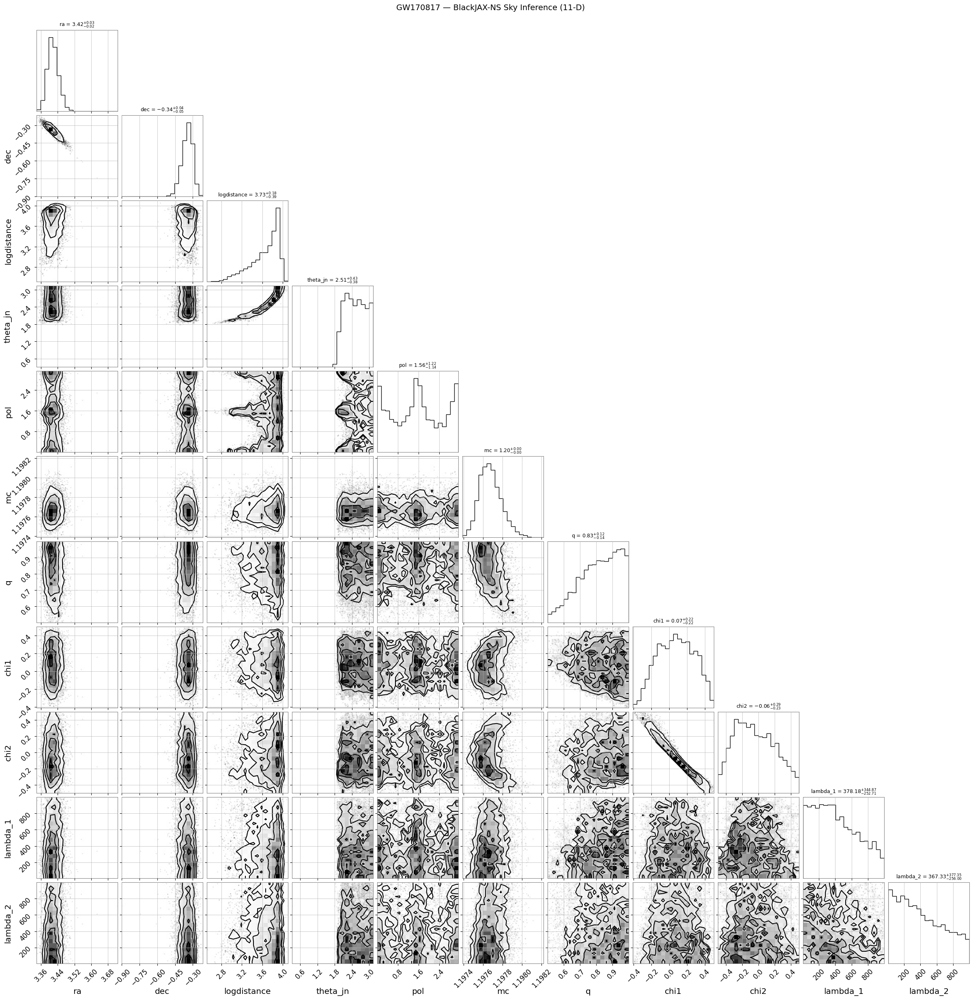

In [ ]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from corner import corner as corner_plot

# ── Save Results ──────────────────────────────────────────────────────
sky_state_path = os.path.join(OUTDIR, f"{LABEL}_11sky_final_state.pkl")
with open(sky_state_path, "wb") as f:
    pickle.dump(final_state_sky, f)
print(f"Final state saved: {sky_state_path}")

sky_csv_path = os.path.join(OUTDIR, f"{LABEL}_11sky_posterior.csv")
samples_anesthetic_sky.to_csv(sky_csv_path)
print(f"Posterior samples saved: {sky_csv_path}")

# ── Full Corner Plot (11-D) ────────────────────────────────────────────
print("\nPlotting full 11-D corner plot...")
eq_array_sky = np.column_stack([np.array(eq_samples_sky[k]) for k in _ravel_order_sky])
ravel_to_param_idx_sky = [_ravel_order_sky.index(k) for k in parameter_names_sky]
samples_plot_sky = eq_array_sky[:, ravel_to_param_idx_sky]

fig_full_sky = corner_plot(
    samples_plot_sky,
    show_titles=True,
    labels=parameter_names_sky,
    title_kwargs={"fontsize": 9}
)
fig_full_sky.suptitle("GW170817 — BlackJAX-NS Sky Inference (11-D)", fontsize=14, y=1.01)
full_sky_corner_path = os.path.join(OUTDIR, f"{LABEL}_11sky_corner_full.png")
fig_full_sky.savefig(full_sky_corner_path, dpi=150, bbox_inches="tight")
print(f"Full corner plot saved: {full_sky_corner_path}")
plt.show()


Final state saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_final_state.pkl
Posterior samples saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_posterior.csv

Plotting full 11-D corner plot...
Full corner plot saved: outdir_time_marg_pe_10/GW170817_time_marg_pe_10_11sky_corner_full.png


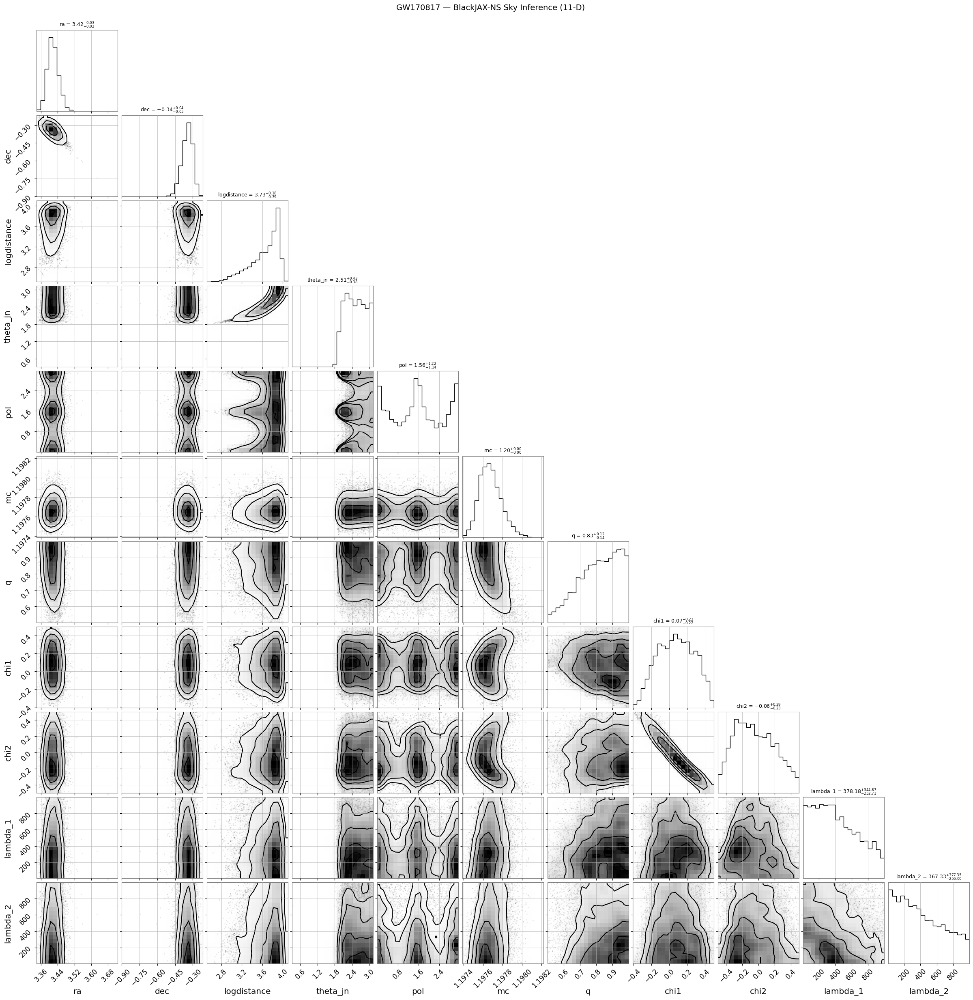

In [ ]:
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from corner import corner as corner_plot

# ── Save Results ──────────────────────────────────────────────────────
sky_state_path = os.path.join(OUTDIR, f"{LABEL}_11sky_final_state.pkl")
with open(sky_state_path, "wb") as f:
    pickle.dump(final_state_sky, f)
print(f"Final state saved: {sky_state_path}")

sky_csv_path = os.path.join(OUTDIR, f"{LABEL}_11sky_posterior.csv")
samples_anesthetic_sky.to_csv(sky_csv_path)
print(f"Posterior samples saved: {sky_csv_path}")

# ── Full Corner Plot (11-D) ────────────────────────────────────────────
print("\nPlotting full 11-D corner plot...")
eq_array_sky = np.column_stack([np.array(eq_samples_sky[k]) for k in _ravel_order_sky])
ravel_to_param_idx_sky = [_ravel_order_sky.index(k) for k in parameter_names_sky]
samples_plot_sky = eq_array_sky[:, ravel_to_param_idx_sky]

fig_full_sky = corner_plot(
    samples_plot_sky,
    show_titles=True,
    labels=parameter_names_sky,
    smooth=1 ,
    title_kwargs={"fontsize": 9}
)
fig_full_sky.suptitle("GW170817 — BlackJAX-NS Sky Inference (11-D)", fontsize=14, y=1.01)
full_sky_corner_path = os.path.join(OUTDIR, f"{LABEL}_11sky_corner_full.png")
fig_full_sky.savefig(full_sky_corner_path, dpi=150, bbox_inches="tight")
print(f"Full corner plot saved: {full_sky_corner_path}")
plt.show()


In [ ]:
import corner
import matplotlib.pyplot as plt
import numpy as np
import os

if 'samples_plot_sky' not in locals():
    print("Error: `samples_plot_sky` not found.")
    print("Please run the 'Parameter Estimation including Sky Position' (11-D) section first.")
else:
    ra_samples = samples_plot_sky[:, 0]
    dec_samples = samples_plot_sky[:, 1]

    # Use the 11-D sky posterior samples currently available in the kernel memory
    sky_samples_plot_11d = np.vstack([ra_samples, dec_samples]).T

    # Literature values (Optical Counterpart of GW170817)
    ra_true = 3.44616
    dec_true = -0.408084

    # Range for plotting
    plot_ranges_sky = [(ra_true-0.6, ra_true+0.6), (dec_true-0.6, dec_true+0.6)]

    # Generate the corner plot for sky location
    fig_sky = corner.corner(
        sky_samples_plot_11d,
        labels=[r'Right Ascension ($\alpha$) [rad]', r'Declination ($\delta$) [rad]'],
        color='red',
        truths=[ra_true, dec_true],        # Overlay the known literature values
        truth_color='black',               # Make the truth lines distinct
        show_titles=True,
        smooth=1,
        range=plot_ranges_sky,
        title_kwargs={"fontsize": 12},
        quantiles=[0.025, 0.5, 0.975],     # Show 95% credible intervals + median
        hist_kwargs={'density': True},
        plot_datapoints=False,
        plot_density=False,
        fill_contours=False,
    )

    plt.suptitle("GW-Only Sky Location (BlackJAX 11D) vs EM Counterpart (Literature)", fontsize=15, y=1.02)
    plt.savefig('sky_location_comparison_11d.png', dpi=300, bbox_inches='tight')
    plt.show()


Error: `samples_plot_sky` not found.
Please run the 'Parameter Estimation including Sky Position' (11-D) section first.


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import corner
import os

# Load the 11-D sky inference posterior from CSV for robustness
sky_csv_path = os.path.join(OUTDIR, f"{LABEL}_11sky_posterior.csv")
df_sky = pd.read_csv(sky_csv_path, skiprows=[1, 2])

# Extract RA and Dec
ra_samples = df_sky['ra'].values[-60000:].astype(float)
dec_samples = df_sky['dec'].values[-60000:].astype(float)

sky_samples_plot_11d = np.vstack([ra_samples, dec_samples]).T

# Literature values (Optical Counterpart of GW170817 - NGC 4993)
ra_true = 3.44616
dec_true = -0.408084

# Set a reasonable plot range around the true values
plot_ranges_sky = [(ra_true - 0.2, ra_true + 0.2), (dec_true - 0.2, dec_true + 0.2)]

# Generate the corner plot
fig_sky = corner.corner(
    sky_samples_plot_11d,
    labels=[r'Right Ascension ($\alpha$) [rad]', r'Declination ($\delta$) [rad]'],
    color='blue',
    truths=[ra_true, dec_true],
    truth_color='red',
    show_titles=True,
    smooth=1,
    range=plot_ranges_sky,
    title_kwargs={"fontsize": 12},
    quantiles=[0.05, 0.5, 0.95],
    hist_kwargs={'density': True, 'alpha': 0.7},
    plot_datapoints=False,
    plot_density=False,
    fill_contours=True,
    contour_kwargs={'alpha': 0.8}
)

plt.suptitle("GW170817 Sky Location Recovery (11-D PE) vs Literature", fontsize=14, y=1.02)
plt.savefig(os.path.join(OUTDIR, 'sky_location_recovery.png'), dpi=300, bbox_inches='tight')
plt.show()